Using API Key to import dataset from Kaggle

In [1]:
import zipfile
import os
import subprocess

# Install dependencies using pip (run this only once)
# subprocess.run(["pip", "install", "imantics"])
# subprocess.run(["pip", "install", "kaggle"])

# Set Kaggle config
kaggle_json_path = "kaggle.json"  # Ensure this is in your "LUNG LESION" folder
os.environ["KAGGLE_CONFIG_DIR"] = os.getcwd()

# Download dataset using Kaggle API
subprocess.run([
    "kaggle", "datasets", "download",
    "-d", "maedemaftouni/covid19-ct-scan-lesion-segmentation-dataset"
])

# Extract the dataset
zip_path = "covid19-ct-scan-lesion-segmentation-dataset.zip"
extract_to = os.path.join(os.getcwd(), "CT_Dataset")

if not os.path.exists(extract_to):
    os.makedirs(extract_to)

with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(extract_to)

# Check extracted contents
print("Extracted folders/files in CT_Dataset:")
print(os.listdir(extract_to))

print("\nFiles in current working directory:")
print(os.listdir())


Traceback (most recent call last):
  File "/home/cse/anaconda3/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/home/cse/anaconda3/lib/python3.11/site-packages/kaggle/__init__.py", line 3, in <module>
    from kaggle.api.kaggle_api_extended import KaggleApi
  File "/home/cse/anaconda3/lib/python3.11/site-packages/kaggle/api/__init__.py", line 6, in <module>
    from kaggle.api.kaggle_api_extended import KaggleApi
  File "/home/cse/anaconda3/lib/python3.11/site-packages/kaggle/api/kaggle_api_extended.py", line 74, in <module>
    from slugify import slugify
ModuleNotFoundError: No module named 'slugify'


Extracted folders/files in CT_Dataset:
['test', 'masks', 'frames', 'train']

Files in current working directory:
['test_metrics_ModifiedUNet.pth', 'lung copy.ipynb', 'mine.ipynb', 'latest.ipynb', 'no.ipynb', 'main1.ipynb', 'best_ResUNet.pth', 'augmented_test', 'lung.ipynb', 'modified.ipynb', 'best_ModifiedUNet.pth', 'copy (copy).ipynb', 'best_EnhancedAttentionUNet.pth', 'copy.ipynb', 'augmented_train', 'test_metrics_EnhancedAttentionUNet.pth', 'test_metrics_ResUNet.pth', 'mode1', 'best_FullModel.pth', 'covid19-ct-scan-lesion-segmentation-dataset.zip', 'test_metrics_ImprovedAttentionUNet.pth', 'best_ImprovedAttentionUNet.pth', 'test_metrics_FullModel.pth', 'main2.ipynb', 'lung copy on best model.ipynb', 'Filtered_images', 'CT_Dataset']


install dependencies

In [2]:
import os  # creating folders, managing file-paths, creating directories, reading images from folders
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt
import shutil  # For deleting empty masks
from glob import glob
from sklearn.model_selection import train_test_split
from albumentations import HorizontalFlip, VerticalFlip, Rotate  # efficient data augmentation
from tqdm import tqdm  # displaying progress bars

import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
#from timm.models.swin_transformer import SwinTransformerBlock
from sklearn.model_selection import train_test_split





Check the loaded data

In [3]:

# Path to the extracted dataset relative to the current working directory
dataset_path = os.path.join(os.getcwd(), "CT_Dataset")

# List files in the dataset directory
files_in_dataset = os.listdir(dataset_path)
print("Files in dataset directory:", files_in_dataset)


Files in dataset directory: ['test', 'masks', 'frames', 'train']


In [4]:

# Define base dataset path
base_path = os.path.join(os.getcwd(), "CT_Dataset")

# Define paths to frames and masks
images_path = os.path.join(base_path, "frames")
masks_path = os.path.join(base_path, "masks")

# Create lists of file names
images_folder = os.listdir(images_path)
masks_folder = os.listdir(masks_path)

print("Total images:", len(images_folder))
print("Total masks:", len(masks_folder))


Total images: 2729
Total masks: 2729


In [5]:
# Check 1: Match the number of files
if len(images_folder) == len(masks_folder):
    print(f"Number of images ({len(images_folder)}) matches number of masks ({len(masks_folder)}).")
else:
    print(f"Mismatch! {len(images_folder)} images and {len(masks_folder)} masks.")

Number of images (2729) matches number of masks (2729).


In [6]:
# Check 2: Match filenames to ensure images and corresponding masks have same filename
mismatch_count = 0
for img, mask in zip(images_folder, masks_folder):
    if os.path.splitext(img)[0] != os.path.splitext(mask)[0]:
        print(f"Mismatch: Image {img} does not correspond to Mask {mask}")
        mismatch_count += 1

if mismatch_count == 0:
    print("All filenames match correctly!")
else:
    print(f"Total mismatches: {mismatch_count}.")

All filenames match correctly!


Check for completely black mask and remove if found (Doesn't contain any information for Segmentation)

In [7]:
# This assumes you're running the script from inside the "LUNG LESION" folder
dataset_folder = os.path.join(os.getcwd(), "CT_Dataset")


# Define paths for masks and images
masks_folder = os.path.join(dataset_folder, "masks")
frames_folder = os.path.join(dataset_folder, "frames")

# Get list of mask files
mask_files = os.listdir(masks_folder)

# Count for removed files
removed_count = 0

# Iterate through each mask file
for mask_file in mask_files:
    mask_path = os.path.join(masks_folder, mask_file)

    # Read the mask as an image
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # Check if the mask is completely black (all pixels are 0)
    if np.all(mask == 0):
        # Print the message for completely black mask found
        print(f"Completely black mask found: {mask_file}")

        # Corresponding image file path
        image_file = mask_file.replace('mask', 'image')
        image_path = os.path.join(frames_folder, image_file)

        # Remove the mask and image file
        os.remove(mask_path)
        os.remove(image_path)

        # Increment removed count
        removed_count += 1

# After removal, Another check to confirm number of remaining mask and image files are equal
remaining_masks = os.listdir(masks_folder)
remaining_images = os.listdir(frames_folder)

print(f"Number of removed files: {removed_count}")
print(f"Remaining mask files: {len(remaining_masks)}")
print(f"Remaining image files: {len(remaining_images)}")

# Ensure the remaining counts are equal
assert len(remaining_masks) == len(remaining_images), "Mismatch between mask and image counts." #safeguard to check the mentioned statement is true or false.


Completely black mask found: bjorke_49.png
Number of removed files: 1
Remaining mask files: 2728
Remaining image files: 2728


Pre-processing (Gaussian Smoothing and CLAHE Contrast enhancement)

Output folder is set to: /media/cse/HDD/Lung lesion/Filtered_images
All preprocessed images are saved in '/media/cse/HDD/Lung lesion/Filtered_images'.


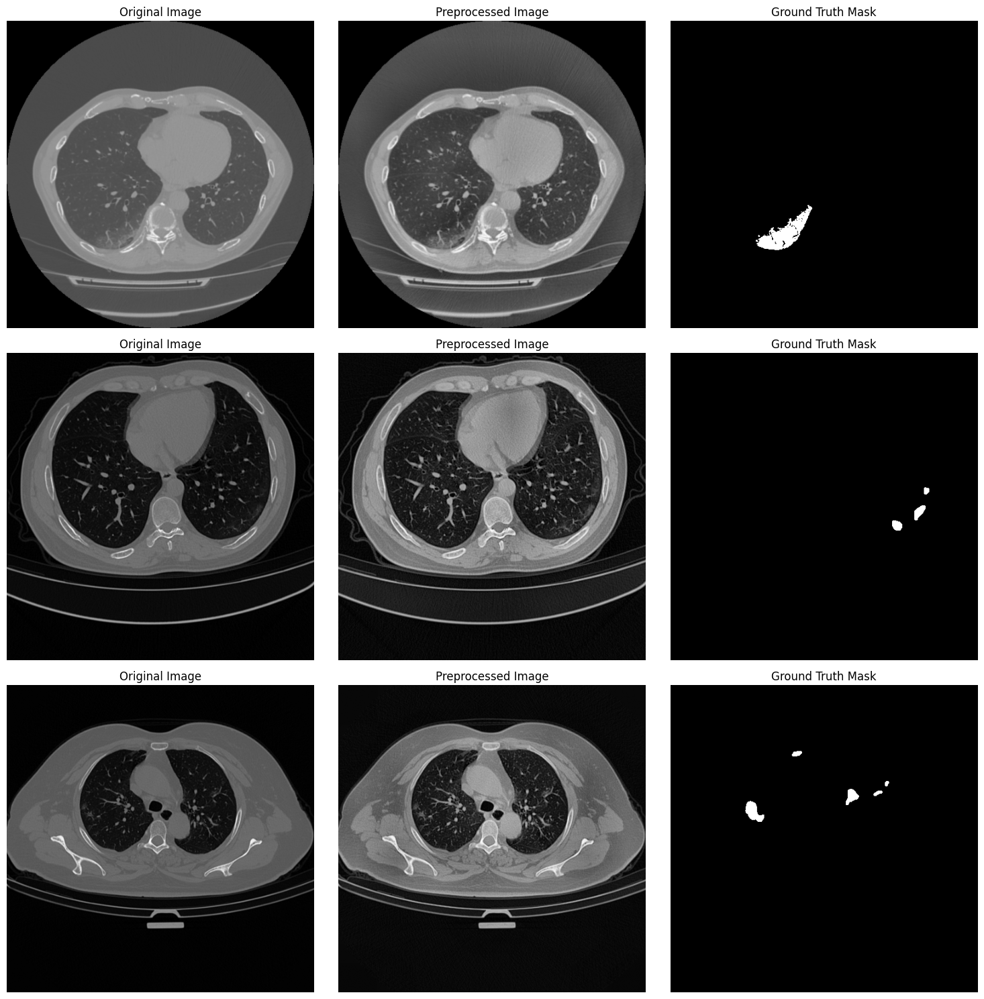

In [8]:
def preprocess_image(image_path, apply_smoothing=False):

    # Read image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply CLAHE
    clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8, 8))
    processed_image = clahe.apply(image)

    #Apply Gaussian smoothing ; Important to reduce noise which may be enhanced during contrats enhancement
    if apply_smoothing:
        processed_image = cv2.GaussianBlur(processed_image, (3, 3), 1)

    return processed_image

def preprocess_all_images(frames_folder, output_folder, apply_smoothing=False):

    #Preprocess all images in frames_folder and save to output_folder.

    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    image_files = sorted(os.listdir(frames_folder))

    for image_file in image_files:
        image_path = os.path.join(frames_folder, image_file)
        output_path = os.path.join(output_folder, image_file)

        # Preprocess image
        processed_image = preprocess_image(image_path)

        # Save preprocessed image
        cv2.imwrite(output_path, processed_image)

    print(f"All preprocessed images are saved in '{output_folder}'.")

def visualize_results(frames_folder, masks_folder, output_folder, num_samples=3):

   #Visualize random samples of original, preprocessed images, and corresponding masks.

    image_files = sorted(os.listdir(frames_folder))
    mask_files = sorted(os.listdir(masks_folder))
    preprocessed_files = sorted(os.listdir(output_folder))

    # Check to ensure the number of images, masks, and preprocessed files match
    if not (len(image_files) == len(mask_files) == len(preprocessed_files)):
        raise ValueError("Number of images, masks, and preprocessed files do not match.")

    # Randomly select samples
    sample_indices = random.sample(range(len(image_files)), num_samples)

    # Plot num_samples images
    plt.figure(figsize=(15, 5 * num_samples))
    for i, idx in enumerate(sample_indices):
        image_path = os.path.join(frames_folder, image_files[idx])
        mask_path = os.path.join(masks_folder, mask_files[idx])
        preprocessed_path = os.path.join(output_folder, preprocessed_files[idx])

        # Load images and masks
        original = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        preprocessed = cv2.imread(preprocessed_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # Original image
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(original, cmap='gray')
        plt.title("Original Image")
        plt.axis('off')

        # Preprocessed image
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(preprocessed, cmap='gray')
        plt.title("Preprocessed Image")
        plt.axis('off')

        # Ground truth mask
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(mask, cmap='gray')
        plt.title("Ground Truth Mask")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Paths to folders
# Create a path to the Filtered_images folder inside the current working directory
output_folder = os.path.join(os.getcwd(), "Filtered_images")

# Create the folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

print("Output folder is set to:", output_folder)

# Preprocess all images and save them
preprocess_all_images(frames_folder, output_folder, apply_smoothing=True)

# Visualize random samples
visualize_results(frames_folder, masks_folder, output_folder, num_samples=3)


Organizing Data into Test and Train Split

In [9]:
# Get current working directory
base_dir = os.getcwd()

# Set correct local paths
frames_path = os.path.join(base_dir, "Filtered_images")
masks_path = os.path.join(base_dir, "CT_Dataset", "masks")  # Assuming masks are inside CT_Dataset/masks

# Optional: Check if paths exist
if not os.path.exists(frames_path):
    print(f"Warning: frames_path does not exist: {frames_path}")
if not os.path.exists(masks_path):
    print(f"Warning: masks_path does not exist: {masks_path}")

# Create train/test directories
train_frames_path = os.path.join(dataset_path, "train", "frames")
train_masks_path = os.path.join(dataset_path, "train", "masks")
test_frames_path = os.path.join(dataset_path, "test", "frames")
test_masks_path = os.path.join(dataset_path, "test", "masks")

os.makedirs(train_frames_path, exist_ok=True)
os.makedirs(train_masks_path, exist_ok=True)
os.makedirs(test_frames_path, exist_ok=True)
os.makedirs(test_masks_path, exist_ok=True)

# Get all frames and masks
frames = sorted(glob(os.path.join(frames_path, "*.png")))
masks = sorted(glob(os.path.join(masks_path, "*.png")))

# Ensure equal numbers of frames and masks
assert len(frames) == len(masks), "Mismatch between frames and masks count!"

# Split into train and test
frames_train, frames_test, masks_train, masks_test = train_test_split(
    frames, masks, test_size=0.2, random_state=42
)

# Move files to train/test directories
for frame, mask in zip(frames_train, masks_train):
    shutil.copy(frame, train_frames_path)
    shutil.copy(mask, train_masks_path)

for frame, mask in zip(frames_test, masks_test):
    shutil.copy(frame, test_frames_path)
    shutil.copy(mask, test_masks_path)

print("Dataset organized successfully!")

Dataset organized successfully!


Displaying some images from Training and Testing Data

                                    IMAGES FROM TRAINING DATA


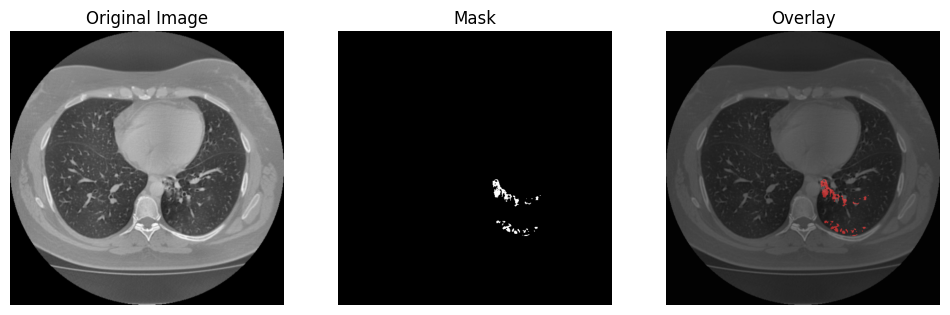

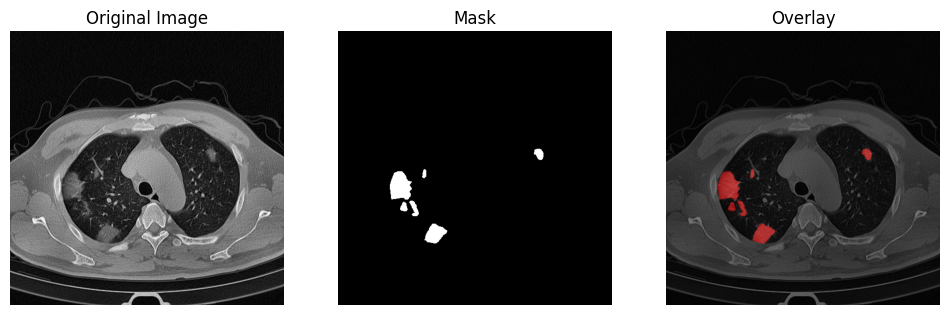

                                     IMAGES FROM TESTING DATA


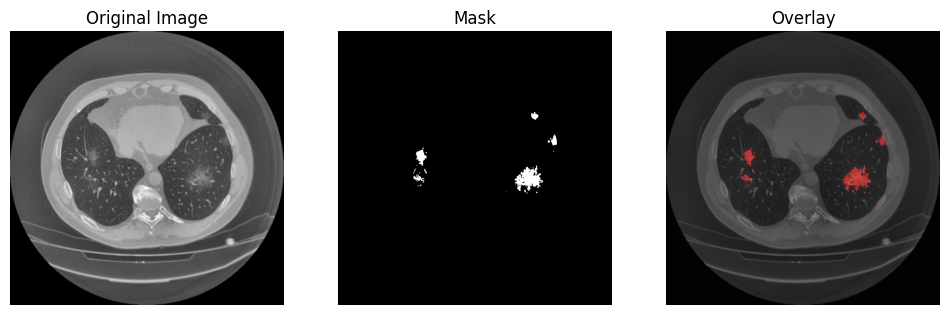

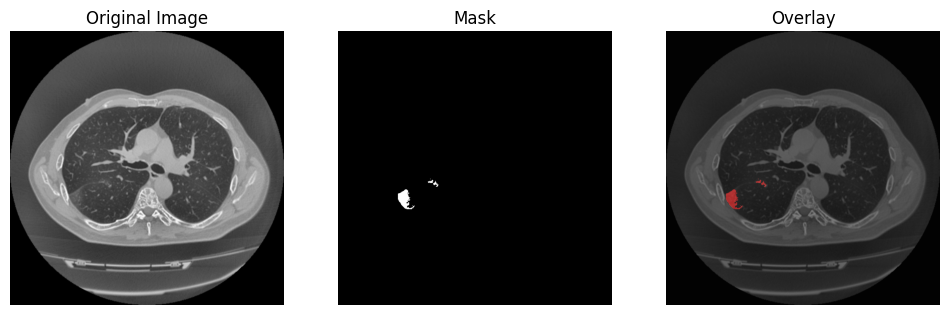

In [10]:
def display_images_with_masks(frames_path, masks_path, num_images=2, title=""):
    # Get all frames and masks
    frames = sorted(glob(os.path.join(frames_path, "*.png")))
    masks = sorted(glob(os.path.join(masks_path, "*.png")))

    # Select random indices
    indices = random.sample(range(len(frames)), num_images)

    # Display images and masks
    for idx in indices:
        # Read the image and mask
        frame = cv2.imread(frames[idx], cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(masks[idx], cv2.IMREAD_GRAYSCALE)

        # Create overlay (optional for better visualization)
        overlay = cv2.addWeighted(frame, 0.7, mask, 0.3, 0)

        # Plot
        plt.figure(figsize=(12, 4))

        # Display original frame
        plt.subplot(1, 3, 1)
        plt.imshow(frame, cmap='gray')
        plt.title("Original Image")
        plt.axis('off')

        # Display mask
        plt.subplot(1, 3, 2)
        plt.imshow(mask, cmap='gray')
        plt.title("Mask")
        plt.axis('off')

        # Display overlay

        # Convert mask to colored (green channel will be used for visibility)
        mask_colored = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
        mask_colored[:, :, 1] = 0  # Set green channel to 0
        mask_colored[:, :, 2] = 0  # Set blue channel to 0

        # Stack the image and mask for visualization (overlay effect)
        overlay = cv2.addWeighted(cv2.cvtColor(frame, cv2.COLOR_GRAY2BGR), 0.5, mask_colored, 0.5, 0)

        plt.subplot(1, 3, 3)
        plt.imshow(overlay, cmap='gray')
        plt.title("Overlay")
        plt.axis('off')

        plt.suptitle(title, fontsize=16)
        plt.show()

# Example Usage:
print("                                    IMAGES FROM TRAINING DATA")
display_images_with_masks(train_frames_path, train_masks_path, num_images=2)

print("                                     IMAGES FROM TESTING DATA")
display_images_with_masks(test_frames_path, test_masks_path, num_images=2)


In [11]:


def load_data_paths(path):
    """
    Load paths to frames and masks for train and test sets.
    """
    train_path = os.path.join(path, "train")
    test_path = os.path.join(path, "test")

    train_frames = sorted(glob(os.path.join(train_path, "frames", "*.png")))
    train_masks  = sorted(glob(os.path.join(train_path, "masks", "*.png")))

    test_frames = sorted(glob(os.path.join(test_path, "frames", "*.png")))
    test_masks  = sorted(glob(os.path.join(test_path, "masks", "*.png")))

    return (train_frames, train_masks), (test_frames, test_masks)

def augment_and_save(image_paths, mask_paths, output_dir, augment=True, img_size=(256, 256), lesion_threshold=0.01):
    """
    Perform augmentation on the provided image and mask paths (if desired)
    and save the resulting images to disk in the output directory.
    
    Augmentation is performed only on images in which the lesion size is below a given threshold.
    """
    os.makedirs(output_dir, exist_ok=True)
    frame_dir = os.path.join(output_dir, "frames")
    mask_dir = os.path.join(output_dir, "masks")
    os.makedirs(frame_dir, exist_ok=True)
    os.makedirs(mask_dir, exist_ok=True)

    count = 0
    for image_path, mask_path in tqdm(zip(image_paths, mask_paths), total=len(image_paths)):
        # Read and preprocess image and mask.
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # Resize and normalize image and mask.
        image = cv2.resize(image, img_size) / 255.0
        mask  = cv2.resize(mask, img_size) / 255.0

        # Calculate lesion size as the percentage of non-zero pixels.
        lesion_size = np.sum(mask > 0) / mask.size

        if augment and lesion_size <= lesion_threshold:
            # Apply horizontal flip augmentation.
            aug = HorizontalFlip(p=1.0)
            augmented = aug(image=image, mask=mask)
            cv2.imwrite(os.path.join(frame_dir, f"{count}_hflip.png"), (augmented['image'] * 255).astype(np.uint8))
            cv2.imwrite(os.path.join(mask_dir, f"{count}_hflip.png"),  (augmented['mask'] * 255).astype(np.uint8))
            count += 1

            # Apply vertical flip augmentation.
            aug = VerticalFlip(p=1.0)
            augmented = aug(image=image, mask=mask)
            cv2.imwrite(os.path.join(frame_dir, f"{count}_vflip.png"), (augmented['image'] * 255).astype(np.uint8))
            cv2.imwrite(os.path.join(mask_dir, f"{count}_vflip.png"),  (augmented['mask'] * 255).astype(np.uint8))
            count += 1

            # Apply rotation augmentation.
            aug = Rotate(limit=45, p=1.0)
            augmented = aug(image=image, mask=mask)
            cv2.imwrite(os.path.join(frame_dir, f"{count}_rotate.png"), (augmented['image'] * 255).astype(np.uint8))
            cv2.imwrite(os.path.join(mask_dir, f"{count}_rotate.png"), (augmented['mask'] * 255).astype(np.uint8))
            count += 1

        # Save the original image and mask.
        cv2.imwrite(os.path.join(frame_dir, f"{count}_orig.png"), (image * 255).astype(np.uint8))
        cv2.imwrite(os.path.join(mask_dir, f"{count}_orig.png"),  (mask * 255).astype(np.uint8))
        count += 1

    print(f"Saved {count} images and masks to {output_dir}")

if __name__ == "__main__":
    # Set your base directory (modify as needed)
    base_dir = "."  
    dataset_path = os.path.join(base_dir, "CT_Dataset")  # Change this to your dataset path
    output_train_dir = os.path.join(base_dir, "augmented_train")
    output_test_dir  = os.path.join(base_dir, "augmented_test")

    # Load dataset paths.
    (train_frames, train_masks), (test_frames, test_masks) = load_data_paths(dataset_path)

    print(f"Original train images: {len(train_frames)}, Original train masks: {len(train_masks)}")
    print(f"Original test images: {len(test_frames)}, Original test masks: {len(test_masks)}")

    # Define lesion size threshold (e.g., 1% of the image size).
    lesion_threshold = 0.01

    # Augment and save training data.
    augment_and_save(train_frames, train_masks, output_train_dir, augment=True, lesion_threshold=lesion_threshold)

    # Augment and save test data with no augmentation.
    augment_and_save(test_frames, test_masks, output_test_dir, augment=False)


Original train images: 2182, Original train masks: 2182
Original test images: 546, Original test masks: 546


100%|██████████| 2182/2182 [00:14<00:00, 148.84it/s]


Saved 5791 images and masks to ./augmented_train


100%|██████████| 546/546 [00:02<00:00, 268.40it/s]

Saved 546 images and masks to ./augmented_test


Display Augmented Images

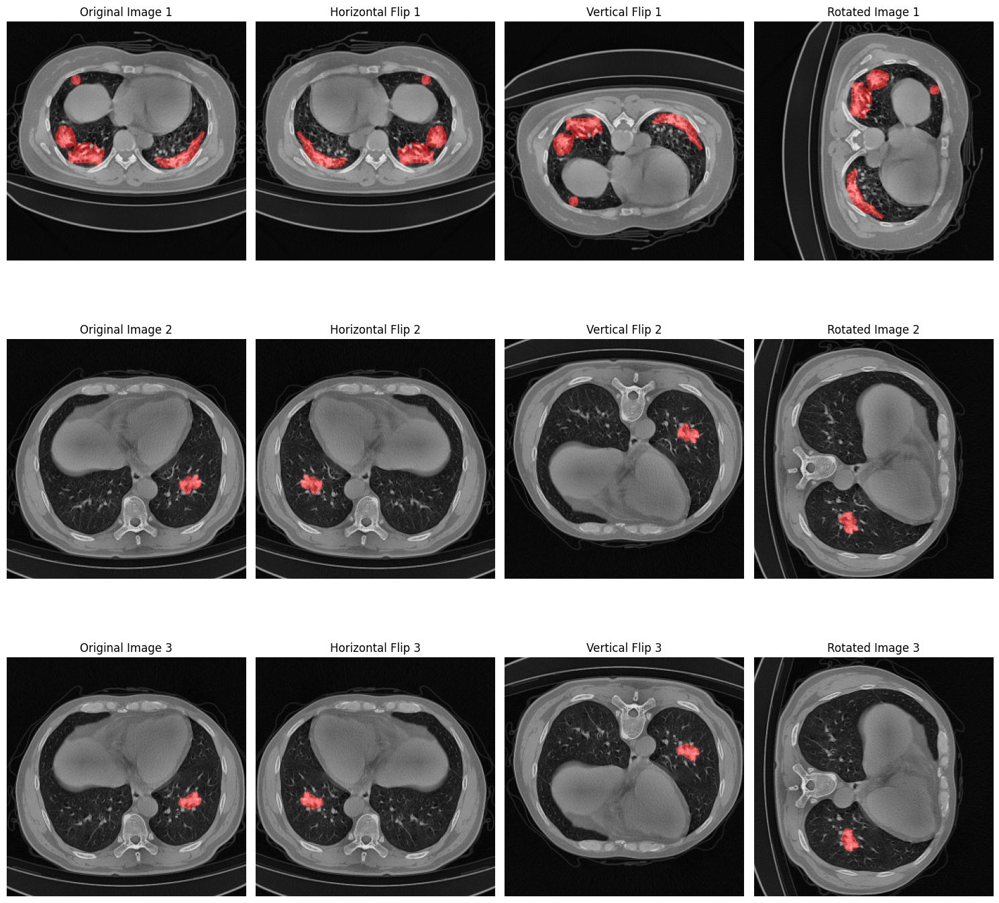

In [12]:
def overlay_mask(image, mask):
    #Overlay the mask on the image with red color.

    image = (image * 255).astype(np.uint8)
    mask = (mask * 255).astype(np.uint8)

    # Create a 3-channel (RGB) version of the image
    image_rgb = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

    # Create a red mask (RGB) by setting the red channel to the mask intensity
    red_mask = np.zeros_like(image_rgb)
    red_mask[mask > 0] = [255, 0, 0]  # Red color for mask areas

    # Overlay the red mask on the image (with transparency)
    overlayed_image = cv2.addWeighted(image_rgb, 1, red_mask, 0.5, 0)

    return overlayed_image

def display_augmented_images(image_dir, mask_dir, num_images=3):

    #Display original, horizontally flipped, vertically flipped, and rotated augmented images with their corresponding masks overlayed in red.

    # List image and mask files in the provided directories
    image_paths = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('_orig.png')])  # Filter original images
    mask_paths = sorted([os.path.join(mask_dir, f) for f in os.listdir(mask_dir) if f.endswith('_orig.png')])  # Filter original masks

    # Check if there are enough images to display
    if len(image_paths) == 0 or len(mask_paths) == 0:
        print("No images or masks found. Exiting.")
        return

    # If there are fewer than num_images, adjust num_images to match the available count
    num_images = min(num_images, len(image_paths), len(mask_paths))

    fig, axes = plt.subplots(num_images, 4, figsize=(15, 5 * num_images))

    for i in range(num_images):
        # Load the original image and mask
        image = cv2.imread(image_paths[i], cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(mask_paths[i], cv2.IMREAD_GRAYSCALE)

        # Check if the image and mask are loaded correctly
        if image is None or mask is None:
            print(f"Error: Could not load image or mask at index {i}. Skipping.")
            continue

        # Normalize the image and mask to the range [0, 1]
        image = image / 255.0
        mask = mask / 255.0

        # Apply augmentations: horizontally flip, vertically flip, rotate
        hflip_image = cv2.flip(image, 1)
        vflip_image = cv2.flip(image, 0)
        rotated_image = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)

        hflip_mask = cv2.flip(mask, 1)
        vflip_mask = cv2.flip(mask, 0)
        rotated_mask = cv2.rotate(mask, cv2.ROTATE_90_CLOCKWISE)

        # Overlay masks in red over the images
        original_overlay = overlay_mask(image, mask)
        hflip_overlay = overlay_mask(hflip_image, hflip_mask)
        vflip_overlay = overlay_mask(vflip_image, vflip_mask)
        rotated_overlay = overlay_mask(rotated_image, rotated_mask)

        # Plot the original image, augmented images, and corresponding masks with overlay
        axes[i, 0].imshow(original_overlay)
        axes[i, 0].set_title(f'Original Image {i+1}')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(hflip_overlay)
        axes[i, 1].set_title(f'Horizontal Flip {i+1}')
        axes[i, 1].axis('off')

        axes[i, 2].imshow(vflip_overlay)
        axes[i, 2].set_title(f'Vertical Flip {i+1}')
        axes[i, 2].axis('off')

        axes[i, 3].imshow(rotated_overlay)
        axes[i, 3].set_title(f'Rotated Image {i+1}')
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
# Get current working directory
base_dir = os.getcwd()

# Paths to the augmented test images and masks
image_dir = os.path.join(base_dir, "augmented_test", "frames")
mask_dir = os.path.join(base_dir, "augmented_test", "masks")

display_augmented_images(image_dir, mask_dir)

Normalized frames and masks are loaded + dimension is added

In [13]:

import albumentations as A
from glob import glob
from torch.utils.data import Dataset, DataLoader

# Constants
IMG_SIZE = (256, 256)
NUM_WORKERS = min(4, os.cpu_count())

class SegmentationDataset(Dataset):
    def __init__(self, data_dir, is_train=False):
        self.frame_dir = os.path.join(data_dir, "frames")
        self.mask_dir = os.path.join(data_dir, "masks")
        self.frames = sorted(glob(os.path.join(self.frame_dir, "*.png")))
        self.masks = sorted(glob(os.path.join(self.mask_dir, "*.png")))
        self.is_train = is_train

        # Update the GaussNoise transform if var_limit is not supported.
        self.train_transform = A.Compose([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
            A.GridDistortion(p=0.2),
            A.GaussNoise(p=0.3),  # Removed var_limit and replaced with std_range.
        ])

    def __len__(self):
        return len(self.frames)

    def __getitem__(self, idx):
        # Load image and mask in grayscale.
        frame = cv2.imread(self.frames[idx], cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(self.masks[idx], cv2.IMREAD_GRAYSCALE)

        # Resize and normalize [0, 1]; then cast to float32.
        frame = cv2.resize(frame, IMG_SIZE, interpolation=cv2.INTER_LANCZOS4) / 255.0
        mask = cv2.resize(mask, IMG_SIZE, interpolation=cv2.INTER_NEAREST) / 255.0

        frame = frame.astype(np.float32)
        mask = mask.astype(np.float32)

        # Apply augmentations only during training.
        if self.is_train:
            transformed = self.train_transform(image=frame, mask=mask)
            frame, mask = transformed['image'], transformed['mask']

        # Convert to tensor and add a channel dimension.
        frame = torch.as_tensor(frame, dtype=torch.float32).unsqueeze(0)
        mask = torch.as_tensor(mask, dtype=torch.float32).unsqueeze(0)

        return frame, mask

def create_loaders(base_dir, batch_size=8):
    train_data_dir = os.path.join(base_dir, "augmented_train")
    test_data_dir = os.path.join(base_dir, "augmented_test")

    train_dataset = SegmentationDataset(train_data_dir, is_train=False)  #change to True if you want more augmenataion
    test_dataset = SegmentationDataset(test_data_dir)

    train_size = int(0.9 * len(train_dataset))
    train_dataset, val_dataset = torch.utils.data.random_split(
        train_dataset,
        [train_size, len(train_dataset) - train_size],
        generator=torch.Generator().manual_seed(42)
    )

    loader_args = {
        'batch_size': batch_size,
        'num_workers': NUM_WORKERS,
        'pin_memory': True,
        'persistent_workers': NUM_WORKERS > 0,
    }

    train_loader = DataLoader(
        train_dataset,
        shuffle=True,
        drop_last=True,
        **loader_args
    )

    val_loader = DataLoader(
        val_dataset,
        shuffle=False,
        **loader_args
    )

    test_loader = DataLoader(
        test_dataset,
        shuffle=False,
        **loader_args
    )

    print(f"Train samples: {len(train_dataset)} | Val samples: {len(val_dataset)} | Test samples: {len(test_dataset)}")
    # Use underlying dataset attribute to check is_train flag.
    print(f"Batch size: {batch_size} | Workers: {NUM_WORKERS} | Augmentations: {train_dataset.dataset.is_train}")

    return train_loader, val_loader, test_loader

# Example usage:
# Ensure base_dir is the parent directory that contains both 'augmented_train' and 'augmented_test'.
base_dir = os.getcwd()  # Adjust this based on your directory structure.
train_loader, val_loader, test_loader = create_loaders(base_dir, batch_size=8)


Train samples: 5211 | Val samples: 580 | Test samples: 546
Batch size: 8 | Workers: 4 | Augmentations: False


In [14]:
def check_y_batch_binary(y_batch):
    unique_values = torch.unique(y_batch)
    print(f"Unique values in y_batch: {unique_values}")

# Example usage (inside your training loop or separately):
for x_batch, y_batch in train_loader:
    check_y_batch_binary(y_batch)
    break  # Check just one batch


Unique values in y_batch: tensor([0.0000, 0.2510, 0.5020, 0.7490, 1.0000])


Definition of Senstivity and Speciality

In [15]:
def sensitivity(preds, target, threshold=0.5, eps=1e-6):

    preds_bin = (preds > threshold).float()
    TP = (preds_bin * target).sum()
    FN = ((1 - preds_bin) * target).sum()
    return (TP + eps) / (TP + FN + eps)

def specificity(preds, target, threshold=0.5, eps=1e-6):

    preds_bin = (preds > threshold).float()
    TN = ((1 - preds_bin) * (1 - target)).sum()
    FP = (preds_bin * (1 - target)).sum()
    return (TN + eps) / (TN + FP + eps)


In [16]:
# --- Metrics used for Logging (apply thresholding internally) ---

def dice_coefficient(y_true, y_pred, smooth=1e-5, thresh=0.5):
    """
    Hard Dice Coefficient.
    y_true: Binary ground truth mask (0 or 1) as torch.float32.
    y_pred: Raw model outputs (logits). Converts them to probabilities using sigmoid,
            thresholds them, and then computes the Dice coefficient.
    """
    y_true = y_true.float()
    probs = torch.sigmoid(y_pred)
    preds = (probs > thresh).float()
    
    y_true_f = y_true.view(-1)
    y_pred_f = preds.view(-1)
    intersection = torch.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (torch.sum(y_true_f) + torch.sum(y_pred_f) + smooth)

def iou_score(y_true, y_pred, smooth=1e-2, thresh=0.5):
    """
    Hard IoU Score.
    Converts raw logits (y_pred) to probabilities using sigmoid,
    thresholds them, and computes IoU.
    """
    y_true = y_true.float()
    probs = torch.sigmoid(y_pred)
    preds = (probs > thresh).float()
    
    y_true_f = y_true.view(-1)
    y_pred_f = preds.view(-1)
    intersection = torch.sum(y_true_f * y_pred_f)
    union = torch.sum(y_true_f) + torch.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

# --- Loss Functions (do not threshold; they work on the continuous sigmoid outputs) ---

def dice_loss(y_true, y_pred, smooth=1e-2):
    """
    Soft Dice Loss computed on continuous probabilities.
    Applies sigmoid internally, but does not threshold.
    """
    y_true = y_true.float()
    probs = torch.sigmoid(y_pred)
    y_true_f = y_true.view(-1)
    y_pred_f = probs.view(-1)
    inter = (y_true_f * y_pred_f).sum()
    score = (2 * inter + smooth) / (y_true_f.sum() + y_pred_f.sum() + smooth)
    return 1 - score

def iou_loss(y_true, y_pred, smooth=1e-2):
    """
    Soft IoU Loss computed on continuous probabilities.
    """
    y_true = y_true.float()
    probs = torch.sigmoid(y_pred)
    y_true_f = y_true.view(-1)
    y_pred_f = probs.view(-1)
    inter = (y_true_f * y_pred_f).sum()
    union = y_true_f.sum() + y_pred_f.sum() - inter
    iou_val = (inter + smooth) / (union + smooth)
    return 1 - iou_val



class FocalLoss(nn.Module):
    """
    Focal Loss for segmentation.
    Expects raw logits as inputs and uses BCEWithLogitsLoss internally.
    """
    def __init__(self, alpha=0.25, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        # Compute BCE loss with logits (this internally applies a numerically stable sigmoid)
        BCE_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction='none')
        # Compute p_t: p_t = exp(-BCE_loss); this equals the sigmoid probability for the positive class,
        # and (1 - sigmoid(prob)) for the negative class.
        pt = torch.exp(-BCE_loss)
        # Calculate focal loss.
        focal_loss = self.alpha * ((1 - pt) ** self.gamma) * BCE_loss
        
        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

# Instantiate the focal loss.
focal_loss_fn = FocalLoss()
bce = nn.BCEWithLogitsLoss()  #since we expect raw inputs

#{'focal_weight': 0.2, 'dice_weight': 0.2, 'iou_weight': 0.6, 'bce_weight': 0.0} gave 

# Instantiate focal loss.
focal_loss_fn = FocalLoss(alpha=0.25, gamma=2.0, reduction='mean')

def combined_loss(y_pred, y_true, focal_weight=0.4, dice_weight=0.3, iou_weight=0.2 , bce_weight=0.1):
    """
    Combined loss: a weighted sum of Focal Loss, Dice Loss, and IoU Loss.
    y_pred: raw logits.
    y_true: binary ground truth mask (values 0 or 1) as torch.float32.
    """
    focal = focal_loss_fn(y_pred, y_true)
    d_loss = dice_loss(y_true, y_pred)
    iou_loss_value = iou_loss(y_true, y_pred)
    bce_loss = bce(y_pred, y_true)
    return focal_weight * focal + dice_weight * d_loss + iou_weight * iou_loss_value + bce_weight*bce_loss


In [17]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.cuda.amp as amp  # For automatic mixed precision
from torch.utils.data import DataLoader  # If you're working with datasets
from torch.optim.lr_scheduler import ReduceLROnPlateau

import torch.amp  # New AMP API




Train function

In [18]:
import torch.optim as optim


def train_model(train_loader, val_loader, model, num_epochs=2, accum_steps=4):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    
    optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3)
    scaler = torch.amp.GradScaler(enabled=torch.cuda.is_available())

    # For logging purposes, we store metrics (loss, dice, and IoU)
    train_loss_list = []
    train_dice_list = []
    train_iou_list = []
    val_loss_list = []
    val_dice_list = []
    val_iou_list = []

    best_dice = 0.0

    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0.0
        train_dice_epoch = 0.0
        train_iou_epoch = 0.0
        optimizer.zero_grad(set_to_none=True)
        num_train_batches = len(train_loader)
        
        for step, (x_batch, y_batch) in enumerate(train_loader):
            x_batch = x_batch.to(device, non_blocking=True)
            y_batch = y_batch.to(device, non_blocking=True).float()
            
            # Ensure mask shape is (B, 1, H, W)
            if y_batch.ndim == 3:
                y_batch = y_batch.unsqueeze(1)
            # Make sure ground-truth is binary.
            y_batch = (y_batch > 0.5).float()

            with torch.amp.autocast("cuda", enabled=torch.cuda.is_available(), dtype=torch.float16):
                outputs = model(x_batch)  # raw logits from model
                loss = combined_loss(outputs, y_batch) / accum_steps

            scaler.scale(loss).backward()
            # Gradient accumulation step.
            if (step + 1) % accum_steps == 0 or (step + 1) == num_train_batches:
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad(set_to_none=True)
                
            epoch_loss += loss.item() * accum_steps

            with torch.no_grad():
                # For metric reporting, use hard thresholding.
                # If model returns a tuple (for deep supervision), choose the main output.
                pred = outputs[0] if isinstance(outputs, tuple) else outputs
                # Convert logits into probabilities then threshold.
                binarized_pred = (torch.sigmoid(pred) > 0.5).float()
                train_dice_epoch += dice_coefficient(y_batch, pred)  # dice_coefficient applies thresholding internally
                train_iou_epoch  += iou_score(y_batch, pred)
        
        avg_train_loss = epoch_loss / num_train_batches
        avg_train_dice = train_dice_epoch / num_train_batches
        avg_train_iou  = train_iou_epoch / num_train_batches

        # Validation loop.
        model.eval()
        val_loss_epoch = 0.0
        val_dice_epoch = 0.0
        val_iou_epoch = 0.0
        num_val_batches = len(val_loader)
        with torch.inference_mode():
            for x_val, y_val in val_loader:
                x_val = x_val.to(device, non_blocking=True)
                y_val = y_val.to(device, non_blocking=True).float()
                if y_val.ndim == 3:
                    y_val = y_val.unsqueeze(1)
                y_val = (y_val > 0.5).float()
                
                with torch.amp.autocast("cuda", enabled=torch.cuda.is_available(), dtype=torch.float16):
                    val_outputs = model(x_val)
                    loss_val = combined_loss(val_outputs, y_val)
                val_loss_epoch += loss_val.item()
                
                pred_val = val_outputs[0] if isinstance(val_outputs, tuple) else val_outputs
                binarized_pred_val = (torch.sigmoid(pred_val) > 0.5).float()
                val_dice_epoch += dice_coefficient(y_val, pred_val)
                val_iou_epoch  += iou_score(y_val, pred_val)
        
        avg_val_loss = val_loss_epoch / num_val_batches
        avg_val_dice = val_dice_epoch / num_val_batches
        avg_val_iou = val_iou_epoch / num_val_batches

        print(f"Epoch {epoch+1}/{num_epochs} | " 
              f"Train Loss: {avg_train_loss:.4f} | Train Dice: {avg_train_dice:.4f} | Train IoU: {avg_train_iou:.4f} | "
              f"Val Loss: {avg_val_loss:.4f} | Val Dice: {avg_val_dice:.4f} | Val IoU: {avg_val_iou:.4f}")
        
        scheduler.step(avg_val_dice)
        if avg_val_dice > best_dice:
            best_dice = avg_val_dice
            torch.save(model.state_dict(), f"best_{model.__class__.__name__}.pth")
        
        train_loss_list.append(avg_train_loss)
        train_dice_list.append(avg_train_dice)
        train_iou_list.append(avg_train_iou)
        val_loss_list.append(avg_val_loss)
        val_dice_list.append(avg_val_dice)
        val_iou_list.append(avg_val_iou)
    
    metrics = {
        'train_loss': train_loss_list,
        'train_dice': train_dice_list,
        'train_iou': train_iou_list,
        'val_loss': val_loss_list,
        'val_dice': val_dice_list,
        'val_iou': val_iou_list,
    }
    print(f"Best validation Dice: {best_dice:.5f}")
    return model, metrics


In [19]:
import matplotlib.pyplot as plt

def visualize_metrics(model, metrics):
    model_name = model.__class__.__name__
    
    # Convert each list of tensors to a list of Python float values.
    train_dice = [t.cpu().item() if torch.is_tensor(t) else t for t in metrics['train_dice']]
    val_dice   = [t.cpu().item() if torch.is_tensor(t) else t for t in metrics['val_dice']]
    train_loss = [t.cpu().item() if torch.is_tensor(t) else t for t in metrics['train_loss']]
    val_loss   = [t.cpu().item() if torch.is_tensor(t) else t for t in metrics['val_loss']]
    train_iou  = [t.cpu().item() if torch.is_tensor(t) else t for t in metrics['train_iou']]
    val_iou    = [t.cpu().item() if torch.is_tensor(t) else t for t in metrics['val_iou']]
    
    plt.figure(figsize=(10,8))
    
    # Dice Coefficient subplot
    plt.subplot(2, 2, 1)
    plt.plot(train_dice, label='Training Dice Coefficient', color='blue')
    plt.plot(val_dice,   label='Validation Dice Coefficient', color='green')
    plt.title(f'{model_name} - Dice Coefficient')
    plt.legend()
    
    # Loss subplot
    plt.subplot(2, 2, 2)
    plt.plot(train_loss, label='Training Loss', color='red')
    plt.plot(val_loss,   label='Validation Loss', color='orange')
    plt.title(f'{model_name} - Loss')
    plt.legend()
    
    # IoU subplot
    plt.subplot(2, 2, 3)
    plt.plot(train_iou, label='Training IoU', color='purple')
    plt.plot(val_iou,   label='Validation IoU', color='brown')
    plt.title(f'{model_name} - IoU')
    plt.legend()
    
    plt.tight_layout()
    plt.show()


In [20]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Assume the following functions are defined elsewhere in your code:
#   - dice_coefficient(y_true, y_pred, smooth=1e-5, thresh=0.5)
#   - iou_score(y_true, y_pred, smooth=1e-2, thresh=0.5)
#   - combined_loss(y_pred, y_true, focal_weight=0.6, dice_weight=0.3, iou_weight=0.1)
#
# Note: Each of these assumes that y_pred are raw logits and that the loss functions
#       internally apply torch.sigmoid() as needed. For metric reporting,
#       dice_coefficient() and iou_score() internally convert logits to probabilities,
#       then threshold them (so that the predictions become 0 or 1).

def test_loop(test_loader, model, model_path=None, device=None):
    import torch
    # Device setup.
    device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Load model checkpoint if a checkpoint path is provided.
    if model_path:
        checkpoint = torch.load(model_path, map_location=device)
        model.load_state_dict(checkpoint)
        print(f"Loaded model state dict from {model_path}.")
    
    model = model.to(device)
    model.eval()
    
    total_loss = 0.0
    total_dice = 0.0
    total_iou = 0.0
    n_batches = 0
    
    # Store outputs from the first batch (for visualization).
    test_outputs = []
    
    with torch.inference_mode():
        for i, (x_test, y_test) in enumerate(test_loader):
            x_test = x_test.to(device, non_blocking=True)
            y_test = y_test.to(device, non_blocking=True).float()

            # Ensure y_test has shape (B, 1, H, W)
            if y_test.ndim == 3:
                y_test = y_test.unsqueeze(1)
            # Make sure ground truth is binary.
            y_test = (y_test > 0.5).float()
            
            # Forward pass: model outputs raw logits.
            outputs = model(x_test)
            main_output = outputs[0] if isinstance(outputs, tuple) else outputs
            
            # Calculate loss using the same combined loss as in training.
            loss = combined_loss(main_output, y_test)
            total_loss += loss.item()
            
            # For metrics, convert raw logits into probabilities via sigmoid and then threshold.
            probs = torch.sigmoid(main_output)
            preds = (probs > 0.5).float()
            
            # Compute metrics using your defined functions:
            dice_val = dice_coefficient(y_test, main_output)  # dice_coefficient applies sigmoid internally
            iou_val  = iou_score(y_test, main_output)
            total_dice += dice_val.item()
            total_iou  += iou_val.item()
            
            # Save predictions (probabilities) and ground truth for the first batch.
            if i == 0:
                test_outputs.append((probs.cpu(), y_test.cpu()))
            
            n_batches += 1
    
    avg_loss = total_loss / n_batches
    avg_dice = total_dice / n_batches
    avg_iou  = total_iou / n_batches
    
    print("\nTest Results:")
    print(f"Loss: {avg_loss:.4f} | Dice: {avg_dice:.4f} | IoU: {avg_iou:.4f}")
    
    test_metrics = {
        'test_loss': avg_loss,
        'test_dice': avg_dice,
        'test_iou': avg_iou
    }
    
    torch.save(test_metrics, f"test_metrics_{model.__class__.__name__}.pth")
    print(f"Test metrics saved to test_metrics_{model.__class__.__name__}.pth")
    
    return test_metrics, test_outputs


In [21]:
import numpy as np
import torch

def predict_masks(model, test_loader, threshold=0.5, device=None, apply_sigmoid=True):
    """
    Generate predicted masks from the model.
    
    Parameters:
      model         : The segmentation model that outputs raw logits.
      test_loader   : A DataLoader containing test images (targets are ignored).
      threshold     : The cutoff threshold to binarize the probabilities.
      device        : Device to run inference on (default is CUDA if available).
      apply_sigmoid : Whether to apply sigmoid to the raw logits.
      
    Returns:
      predicted_masks : A NumPy array of binary masks.
    """
    # Set device if not provided.
    device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()

    predicted_masks = []
    
    with torch.no_grad():
        for x_test_batch, _ in test_loader:  # Targets are ignored for prediction.
            x_test_batch = x_test_batch.to(device)
            
            # Forward pass: if model returns a tuple (e.g., deep supervision outputs), use the main output.
            outputs = model(x_test_batch)
            if isinstance(outputs, tuple):
                outputs = outputs[0]
            
            # Optionally apply sigmoid to convert raw logits to probability maps.
            if apply_sigmoid:
                probs = torch.sigmoid(outputs)
            else:
                probs = outputs
            
            # Binarize the predictions using the specified threshold.
            preds = (probs > threshold).cpu().numpy().astype(np.uint8)
            
            # Collect batch predictions.
            predicted_masks.extend(preds)
    
    # Convert list to NumPy array for further use or visualization.
    predicted_masks = np.array(predicted_masks)
    return predicted_masks


In [22]:
import numpy as np
import torch
import matplotlib.pyplot as plt

def visualize_predictions(model, test_loader, device, num_images=10):
    """
    Visualize model predictions alongside original images and ground-truth masks.

    Parameters:
      model      : The segmentation model which outputs raw logits.
      test_loader: A DataLoader providing test data (x_test, y_test).
      device     : Computation device ('cuda' or 'cpu').
      num_images : Number of examples to visualize.

    Functionality:
      - Puts the model into evaluation mode.
      - Iterates over the test_loader, and for each batch:
          • Moves the inputs and targets to the specified device.
          • Applies the model to obtain raw outputs (logits).
          • If deep supervision is used, only the main logits output is retained.
          • Converts the raw logits into probabilities via torch.sigmoid.
          • Thresholds these probabilities (with threshold=0.5) to produce binary masks.
      - Stores the original images, ground-truth, and predicted masks.
      - Visualizes a selection of the predicted results.
    """
    model.eval()  # Set the model to evaluation mode.
    predictions_list = []
    x_test_list = []
    y_test_list = []

    with torch.no_grad():
        for x_test_batch, y_test_batch in test_loader:
            x_test_batch = x_test_batch.to(device, non_blocking=True)
            y_test_batch = y_test_batch.to(device, non_blocking=True).float()
            
            # Ensure y_test has shape (B, 1, H, W) if needed.
            if y_test_batch.ndim == 3:
                y_test_batch = y_test_batch.unsqueeze(1)
            
            # Get model output. If deep supervision is applied, use the primary output.
            outputs = model(x_test_batch)
            if isinstance(outputs, tuple):
                outputs = outputs[0]
                
            # Convert raw logits to probabilities.
            probs = torch.sigmoid(outputs)
            # Threshold probabilities to get binary predictions.
            predictions = (probs > 0.5).cpu().numpy().astype(np.uint8)
            
            # Store predictions and corresponding original images and targets.
            predictions_list.extend(predictions)
            x_test_list.extend(x_test_batch.cpu().numpy())
            y_test_list.extend(y_test_batch.cpu().numpy())
    
    # Visualize a selection of examples.
    for i in range(min(num_images, len(predictions_list))):
        plt.figure(figsize=(12, 6))
        
        plt.subplot(1, 3, 1)
        plt.imshow(np.squeeze(x_test_list[i]), cmap='gray')
        plt.title("Original Image")
        plt.axis('off')
        
        plt.subplot(1, 3, 2)
        plt.imshow(np.squeeze(y_test_list[i]), cmap='gray')
        plt.title("Ground Truth Mask")
        plt.axis('off')
        
        plt.subplot(1, 3, 3)
        plt.imshow(np.squeeze(predictions_list[i]), cmap='gray')
        plt.title("Predicted Mask")
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()


Model A  (Attention swin unet)

In [23]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from einops import rearrange
from timm.models.swin_transformer import window_partition, window_reverse

# ----------------------------------------
# 1) Dual Attention: Fuses channel and spatial attention
# ----------------------------------------
class DualAttention(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.se = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(channels, channels // 16, 1),
            nn.ReLU(),
            nn.Conv2d(channels // 16, channels, 1),
            nn.Sigmoid()
        )
        self.sa = nn.Sequential(
            nn.Conv2d(2, 1, 7, padding=3, bias=False),
            nn.Sigmoid()
        )
        self.fusion = nn.Conv2d(channels * 2, channels, 1)

    def forward(self, x):
        se = self.se(x)
        sa = self.sa(torch.cat([x.mean(1, keepdim=True), x.max(1, keepdim=True)[0]], dim=1))
        fused = self.fusion(torch.cat([x * se, x * sa], dim=1))
        return fused + x

# ----------------------------------------
# 2) Window-Based Self-Attention with Learnable Shift & Adaptive Padding
# ----------------------------------------
class WindowAttention(nn.Module):
    def __init__(self, dim, num_heads=8, window_size=7, shift_size=0, dropout=0.0):
        super().__init__()
        self.dim = dim
        self.num_heads = num_heads
        self.window_size = window_size  # assume square windows
        # Learnable shift offset (in normalized coordinates)
        self.shift_offset = nn.Parameter(torch.zeros(1, 1, 1, 2))
        self.qkv = nn.Linear(dim, dim * 3)
        self.proj = nn.Linear(dim, dim)
        # Relative position bias table
        self.relative_position_bias_table = nn.Parameter(
            torch.zeros((2 * window_size - 1) * (2 * window_size - 1), num_heads)
        )
        # Build pair-wise relative index
        coords = torch.arange(window_size)
        grid = torch.stack(torch.meshgrid(coords, coords, indexing='ij'))  # shape: [2, window_size, window_size]
        grid = grid.flatten(1)  # shape: [2, window_size*window_size]
        relative_coords = grid[:, :, None] - grid[:, None, :]  # shape: [2, ws*ws, ws*ws]
        relative_coords = relative_coords.permute(1, 2, 0).contiguous()  # [ws*ws, ws*ws, 2]
        relative_coords += window_size - 1
        self.register_buffer("relative_index", relative_coords.sum(-1))
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        # x: [B, C, H, W]
        B, C, H, W = x.shape

        # Create normalized coordinate grid for grid_sample
        ys = torch.linspace(-1, 1, H, device=x.device)
        xs = torch.linspace(-1, 1, W, device=x.device)
        grid_y, grid_x = torch.meshgrid(ys, xs, indexing='ij')
        base_grid = torch.stack((grid_x, grid_y), -1)  # [H, W, 2]
        base_grid = base_grid.unsqueeze(0).expand(B, H, W, 2)  # [B, H, W, 2]

        # Apply learned shift via grid_sample
        shifted_x = F.grid_sample(x, base_grid + self.shift_offset,
                                  mode='bilinear', padding_mode='border', align_corners=True)
        # Rearrange from [B, C, H, W] to [B, H, W, C] as expected by window_partition
        shifted_x = rearrange(shifted_x, 'b c h w -> b h w c')
        
        # ===== Padding to make H and W divisible by window_size =====
        pad_bottom = (self.window_size - H % self.window_size) % self.window_size
        pad_right  = (self.window_size - W % self.window_size) % self.window_size
        if pad_bottom > 0 or pad_right > 0:
            # F.pad expects the padding in the order: (left, right, top, bottom)
            # For a tensor of shape [B, H, W, C], we need to permute it to [B, C, H, W] for padding.
            shifted_x = rearrange(shifted_x, 'b h w c -> b c h w')
            shifted_x = F.pad(shifted_x, (0, pad_right, 0, pad_bottom))  # pad last two dims: (W, H)
            shifted_x = rearrange(shifted_x, 'b c h w -> b h w c')
        else:
            # no padding needed, H_padded and W_padded remain the same.
            pass

        H_padded = H + pad_bottom
        W_padded = W + pad_right

        # Partition windows (pass window_size as a tuple)
        windows = window_partition(shifted_x, (self.window_size, self.window_size))
        # windows shape: [nW*B, window_size, window_size, C]
        nW = windows.shape[0]
        windows = windows.view(nW, -1, C)  # shape: [nW, window_size*window_size, C]

        # QKV projection
        qkv = self.qkv(windows).reshape(nW, -1, 3, self.num_heads, C // self.num_heads)
        q, k, v = qkv.permute(2, 0, 3, 1, 4)  # each: [nW, num_heads, window_size*window_size, C//num_heads]
        attn = (q @ k.transpose(-2, -1)) * (C ** -0.5)
        # Add relative positional bias
        rb = self.relative_position_bias_table[self.relative_index.view(-1)].view(
            self.window_size * self.window_size, self.window_size * self.window_size, -1)
        rb = rb.permute(2, 0, 1).unsqueeze(0)  # shape: [1, num_heads, ws*ws, ws*ws]
        attn = F.softmax(attn + rb, dim=-1)
        attn = self.dropout(attn)
        x_out = (attn @ v).transpose(1, 2).reshape(nW, self.window_size, self.window_size, C)
        
        # Merge windows back to [B, H_padded, W_padded, C]
        merged = window_reverse(x_out, (self.window_size, self.window_size), H_padded, W_padded)
        merged = rearrange(merged, 'b h w c -> b c h w')
        
        # Crop back to original H and W if padded
        if pad_bottom > 0 or pad_right > 0:
            merged = merged[:, :, :H, :W]
            base_grid = base_grid[:, :H, :W, :]

        # Reverse the shift using grid_sample
        rev = F.grid_sample(merged, base_grid - self.shift_offset,
                            mode='bilinear', padding_mode='border', align_corners=True)
        return rev

# ----------------------------------------
# 3) SwinBlock combining attention + MLP
# ----------------------------------------
class SwinBlock(nn.Module):
    def __init__(self, dim, num_heads=8, window_size=7, mlp_ratio=4.0, dropout=0.0):
        super().__init__()
        self.norm1 = nn.LayerNorm(dim)
        self.attn = WindowAttention(dim, num_heads, window_size, dropout=dropout)
        self.norm2 = nn.LayerNorm(dim)
        self.mlp = nn.Sequential(
            nn.Linear(dim, int(dim * mlp_ratio)),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(int(dim * mlp_ratio), dim),
            nn.Dropout(dropout)
        )

    def forward(self, x):
        # x: (B, C, H, W)
        u = x
        # Permute to (B, H, W, C) for LayerNorm, then revert back
        x_norm = self.norm1(x.permute(0, 2, 3, 1)).permute(0, 3, 1, 2)
        x = self.attn(x_norm)
        x = x + u
        y = self.mlp(self.norm2(x.permute(0, 2, 3, 1)))
        y = y.permute(0, 3, 1, 2)
        return x + y

# ----------------------------------------
# 4) Attention Gate for skip connections
# ----------------------------------------
class AttentionGate(nn.Module):
    def __init__(self, F_g, F_l):
        super().__init__()
        self.W_g = nn.Sequential(nn.Conv2d(F_g, F_l, 1), nn.BatchNorm2d(F_l))
        self.W_x = nn.Sequential(nn.Conv2d(F_l, F_l, 1), nn.BatchNorm2d(F_l))
        self.psi = nn.Sequential(nn.Conv2d(F_l, 1, 1), nn.BatchNorm2d(1), nn.Sigmoid())

    def forward(self, g, x):
        psi = F.relu(self.W_g(g) + self.W_x(x))
        return x * self.psi(psi)

# ----------------------------------------
# 5) Optimized ConvBlock with DualAttention
# ----------------------------------------
class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv1 = nn.Conv2d(in_ch, out_ch // 2, 3, padding=1)
        self.norm1 = nn.GroupNorm(8, out_ch // 2)
        self.conv2 = nn.Conv2d(out_ch // 2, out_ch, 3, padding=1)
        self.norm2 = nn.GroupNorm(8, out_ch)
        self.attn = DualAttention(out_ch)
        self.drop = nn.Dropout2d(0.1)

    def forward(self, x):
        x = F.relu(self.norm1(self.conv1(x)))
        x = F.relu(self.norm2(self.conv2(x)))
        x = self.attn(x)
        return self.drop(x)

# ----------------------------------------
# 6) Upsample Block
# ----------------------------------------
class UpConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.up = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(in_ch, out_ch, 3, padding=1)
        )

    def forward(self, x):
        return self.up(x)

# ----------------------------------------
# 7) FinalModel with deep supervision
# ----------------------------------------
class FullModel(nn.Module):
    def __init__(self, in_ch=1, out_ch=1):
        super().__init__()
        # Encoder
        self.enc1 = ConvBlock(in_ch, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = ConvBlock(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = ConvBlock(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        self.enc4 = ConvBlock(256, 512)
        self.pool4 = nn.MaxPool2d(2)
        # Bottleneck
        self.bottleneck = nn.Sequential(
            ConvBlock(512, 512),
            SwinBlock(512, num_heads=8, window_size=7),
            SwinBlock(512, num_heads=8, window_size=7)
        )
        # Decoder with Attention Gates
        self.up4 = UpConv(512, 256)
        self.att4 = AttentionGate(256, 512)
        self.dec4 = ConvBlock(512, 256)
        
        self.up3 = UpConv(256, 128)
        self.att3 = AttentionGate(128, 256)
        self.dec3 = ConvBlock(256, 128)
        
        self.up2 = UpConv(128, 64)
        self.att2 = AttentionGate(64, 128)
        self.dec2 = ConvBlock(128, 64)
        
        self.up1 = UpConv(64, 32)
        self.att1 = AttentionGate(32, 64)
        self.dec1 = ConvBlock(64, 32)
        
        # Heads (deep supervision outputs are optional here)
        self.final = nn.Conv2d(32, out_ch, 1)
        self.ds4 = nn.Conv2d(256, out_ch, 1)
        self.ds3 = nn.Conv2d(128, out_ch, 1)
        self.ds2 = nn.Conv2d(64, out_ch, 1)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        e3 = self.enc3(self.pool2(e2))
        e4 = self.enc4(self.pool3(e3))
        b = self.bottleneck(self.pool4(e4))
        # Decoder
        d4 = self.dec4(self.att4(self.up4(b), e4))
        d3 = self.dec3(self.att3(self.up3(d4), e3))
        d2 = self.dec2(self.att2(self.up2(d3), e2))
        d1 = self.dec1(self.att1(self.up1(d2), e1))
        out = self.final(d1)
    
        return out




Training Modela A

In [ ]:
base_dir = os.getcwd()# Update this path accordingly

# Create the data loaders
train_loader, val_loader, test_loader = create_loaders(base_dir, batch_size=8)


modelA = FullModel()  # Replace with your model architecture

# Choose device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


modelA, train_metrics_A = train_model(train_loader, val_loader, model=modelA, num_epochs=50, accum_steps=4)
#NEEDS LIKE 70 EPOCHS, takes 1 20 secs per epoch


Train samples: 5211 | Val samples: 580 | Test samples: 546
Batch size: 8 | Workers: 4 | Augmentations: False
Epoch 1/50 | Train Loss: 0.5111 | Train Dice: 0.1455 | Train IoU: 0.0909 | Val Loss: 0.4681 | Val Dice: 0.4963 | Val IoU: 0.3388
Epoch 2/50 | Train Loss: 0.3901 | Train Dice: 0.5549 | Train IoU: 0.3948 | Val Loss: 0.3073 | Val Dice: 0.5508 | Val IoU: 0.3892
Epoch 3/50 | Train Loss: 0.2367 | Train Dice: 0.6725 | Train IoU: 0.5134 | Val Loss: 0.1933 | Val Dice: 0.7133 | Val IoU: 0.5615
Epoch 4/50 | Train Loss: 0.1928 | Train Dice: 0.7102 | Train IoU: 0.5558 | Val Loss: 0.1814 | Val Dice: 0.7191 | Val IoU: 0.5683
Epoch 5/50 | Train Loss: 0.1793 | Train Dice: 0.7240 | Train IoU: 0.5722 | Val Loss: 0.1668 | Val Dice: 0.7417 | Val IoU: 0.5967
Epoch 6/50 | Train Loss: 0.1689 | Train Dice: 0.7391 | Train IoU: 0.5915 | Val Loss: 0.1596 | Val Dice: 0.7523 | Val IoU: 0.6093
Epoch 7/50 | Train Loss: 0.1623 | Train Dice: 0.7492 | Train IoU: 0.6038 | Val Loss: 0.1579 | Val Dice: 0.7544 | Val 

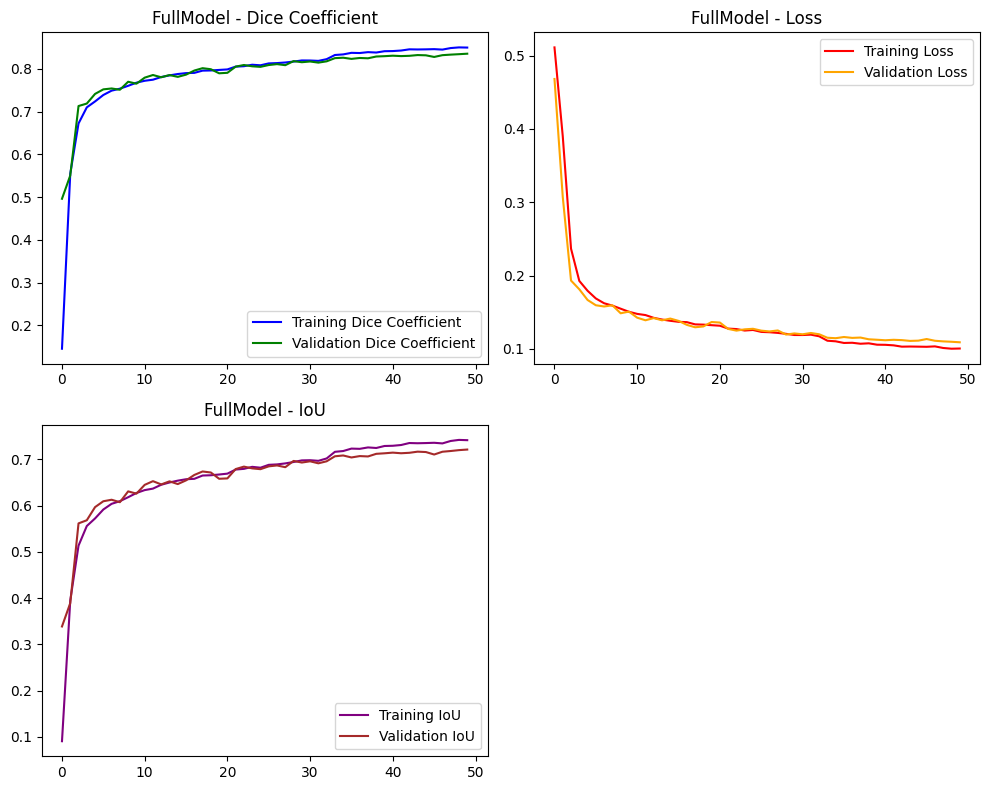

In [25]:

visualize_metrics(modelA, train_metrics_A)

In [26]:
test_metrics_A, test_outputs = test_loop(
    test_loader, 
    model=modelA, 
    model_path="best_FullModel.pth", 
    device=device
)

print("Test Metrics:")
print(test_metrics_A)




Loaded model state dict from best_FullModel.pth.

Test Results:
Loss: 0.1097 | Dice: 0.8398 | IoU: 0.7291
Test metrics saved to test_metrics_FullModel.pth
Test Metrics:
{'test_loss': 0.10970870848151221, 'test_dice': 0.8397822889728822, 'test_iou': 0.7291255619214929}


Predicted masks shape: (546, 1, 256, 256)


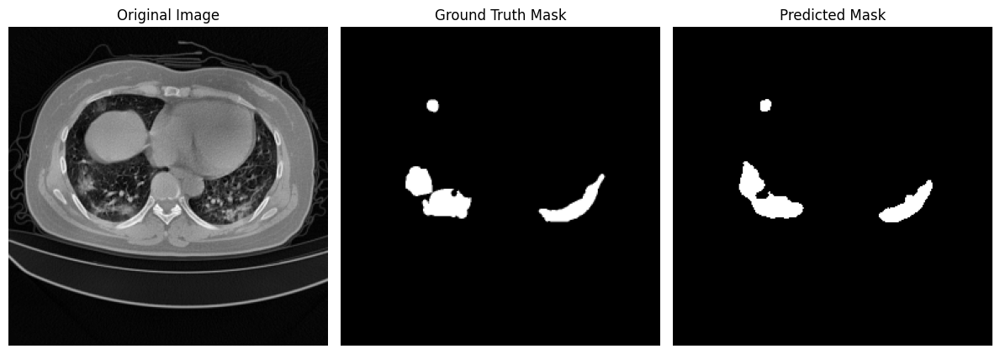

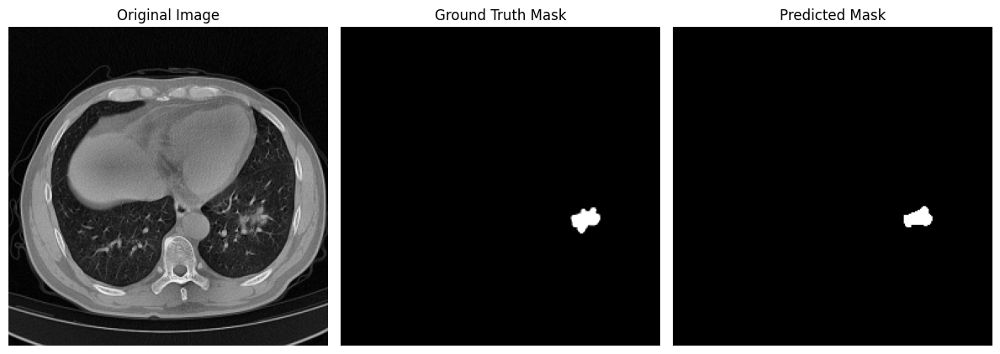

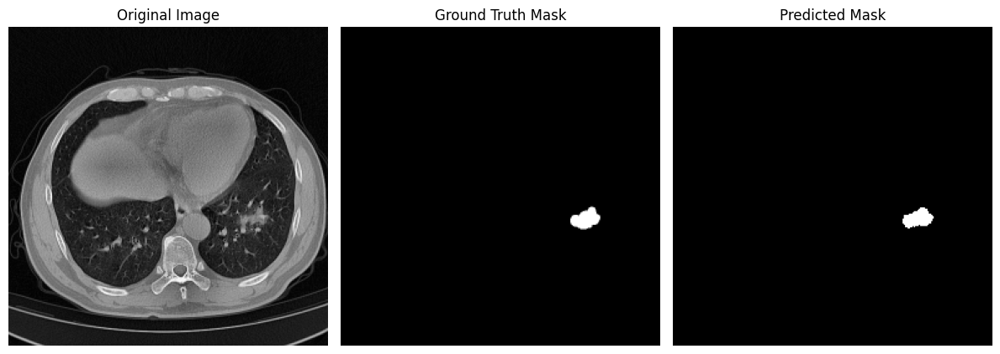

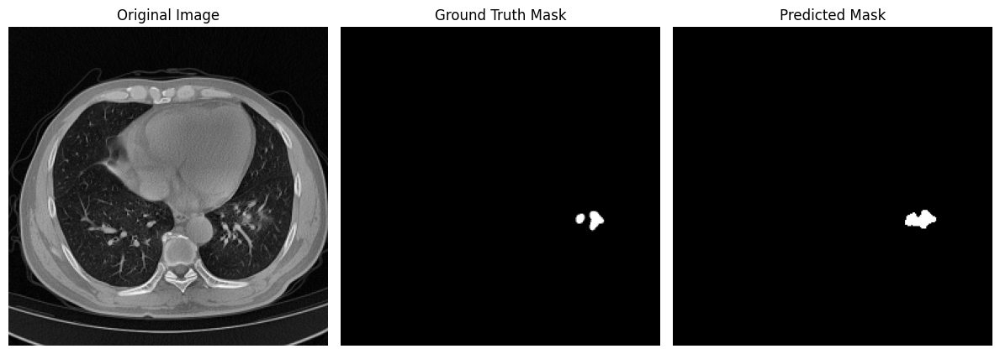

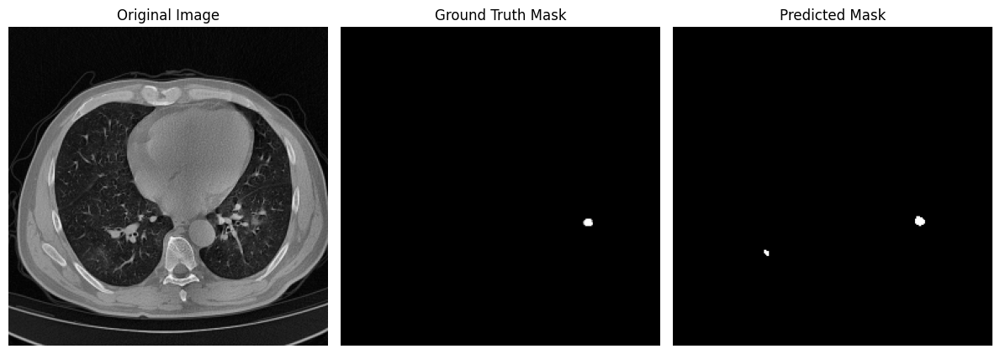

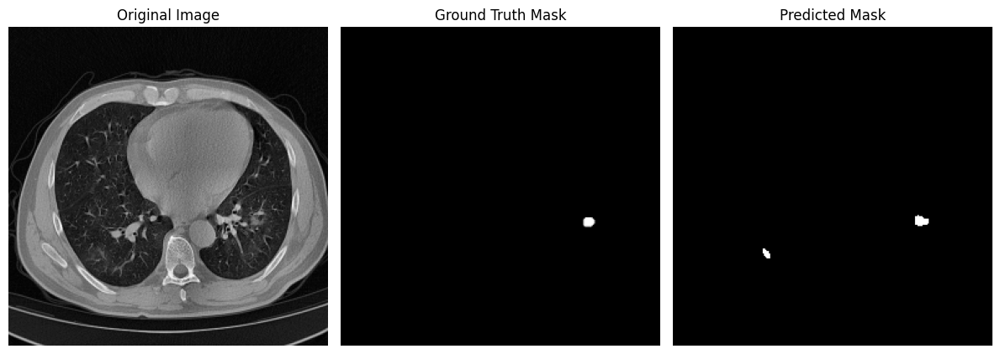

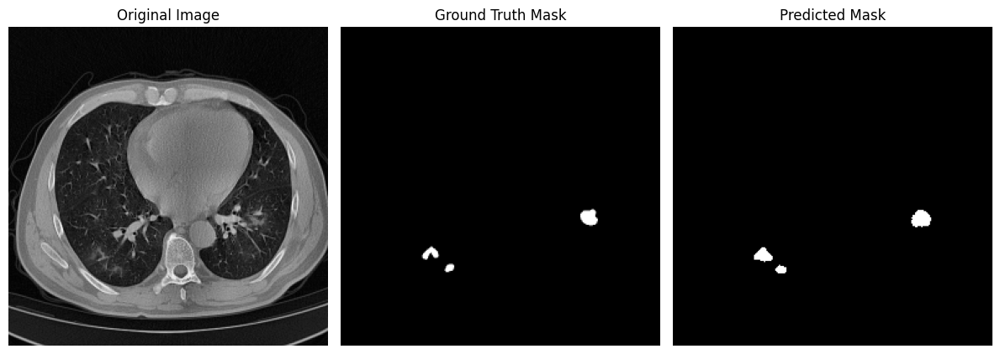

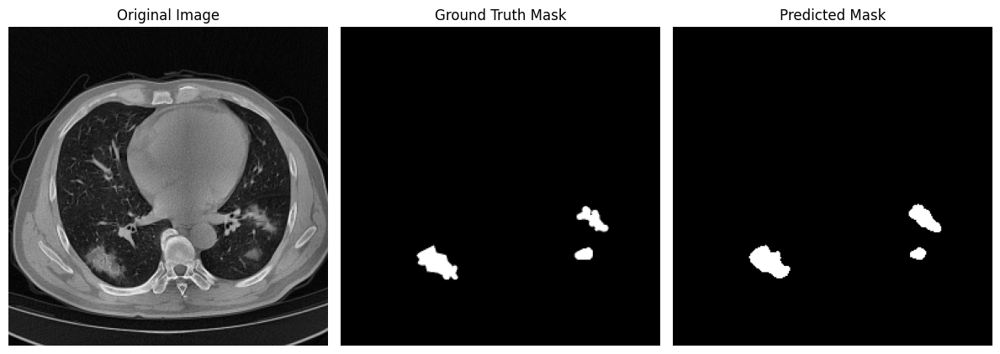

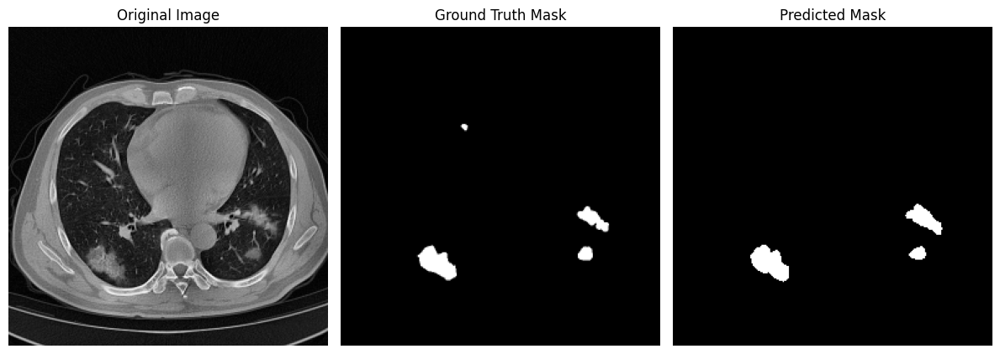

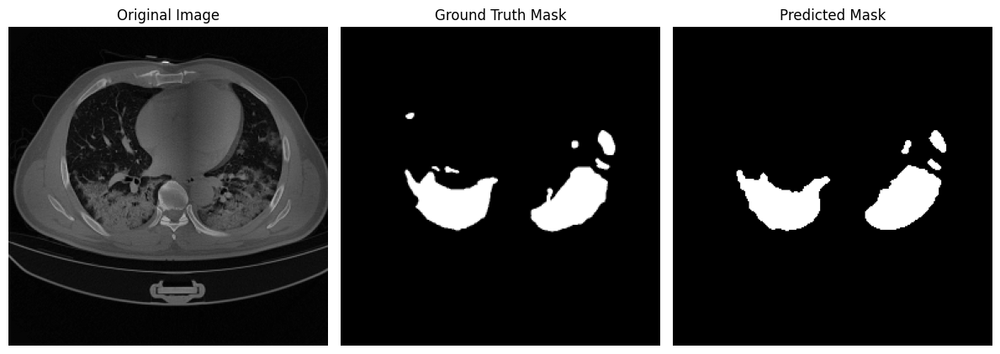

In [27]:
predicted_masks = predict_masks(modelA, test_loader, threshold=0.5, device=device, apply_sigmoid=True)

# Optionally, print out the shape or some info about predicted masks
print("Predicted masks shape:", predicted_masks.shape)


visualize_predictions(modelA, test_loader, device=device, num_images=10)

Model B

In [28]:

import torch
import torch.nn as nn
import torch.nn.functional as F

class DualAttentionBlock(nn.Module):
    #Combined channel and spatial attention with dynamic dilation
    def __init__(self, channel, reduction=16, dilation_rates=(1, 2, 4)):
        super().__init__()
        # Channel attention
        self.ch_att = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(channel, channel // reduction, 1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(channel // reduction, channel, 1),
            nn.Sigmoid()
        )

        # Spatial attention with multi-scale context
        self.spatial_convs = nn.ModuleList([
            nn.Conv2d(channel, channel // 4, 3, padding=d, dilation=d)
            for d in dilation_rates
        ])
        self.spatial_fuse = nn.Sequential(
            nn.Conv2d(channel + len(dilation_rates) * (channel // 4), channel, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        ca = self.ch_att(x)
        spatial_feats = [conv(x) for conv in self.spatial_convs]
        sa = self.spatial_fuse(torch.cat([x] + spatial_feats, dim=1))
        return x * ca * sa

class MultiScaleResBlock(nn.Module):
   # Residual block with multi-scale convolutions
    def __init__(self, in_ch, out_ch, se=True):
        super().__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.GroupNorm(16, out_ch),
            nn.LeakyReLU(0.2)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, 3, padding=2, dilation=2),
            nn.GroupNorm(16, out_ch),
            nn.LeakyReLU(0.2),
            nn.Conv2d(out_ch, out_ch, 3, padding=3, dilation=3),
            nn.GroupNorm(16, out_ch),
            nn.LeakyReLU(0.2)
        )
        self.att = DualAttentionBlock(out_ch) if se else None
        self.residual = nn.Conv2d(in_ch, out_ch, 1) if in_ch != out_ch else nn.Identity()

    def forward(self, x):
        residual = self.residual(x)
        x = self.conv1(x)
        x = self.conv2(x)
        if self.att:
            x = self.att(x)
        return F.leaky_relu(x + residual, 0.2)

class BoundaryAwareAttention(nn.Module):
    #Attention guided by boundary features
    def __init__(self, F_g, F_l, F_int):
        super().__init__()
        self.boundary_conv = nn.Sequential(
            nn.Conv2d(F_l, F_int, 3, padding=1),
            nn.GroupNorm(8, F_int),
            nn.LeakyReLU(0.2)
        )
        self.attention = nn.Sequential(
            nn.Conv2d(F_g + F_int, F_int, 3, padding=1),  # expects F_g + F_int channels
            nn.GroupNorm(8, F_int),
            nn.LeakyReLU(0.2),
            nn.Conv2d(F_int, 1, 1),
            nn.Sigmoid()
        )

    def forward(self, g, x):
        boundary = self.boundary_conv(x)
        # Resize gating signal to match x's spatial dimensions
        g = F.interpolate(g, x.shape[2:], mode='bilinear', align_corners=False)
        att = self.attention(torch.cat([g, boundary], dim=1))
        return x * att

class EnhancedAttentionUNet(nn.Module):
    def __init__(self, in_ch=1, out_ch=1):
        super().__init__()
        # Encoder
        self.enc1 = MultiScaleResBlock(in_ch, 64)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = MultiScaleResBlock(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = MultiScaleResBlock(128, 256)
        self.pool3 = nn.MaxPool2d(2)

        self.enc4 = MultiScaleResBlock(256, 512)
        self.pool4 = nn.MaxPool2d(2)

        # Bottleneck
        self.bottleneck = nn.Sequential(
            MultiScaleResBlock(512, 1024),
            nn.Conv2d(1024, 512, 3, padding=6, dilation=6),
            nn.GroupNorm(32, 512),
            nn.LeakyReLU(0.2)
        )

        # Decoder with corrected dimensions
        self.up4 = self._make_up(512, 256)  # 512 -> 256
        self.att4 = BoundaryAwareAttention(512, 512, 128)  # gating from b has 512 channels; skip (e4) has 512 channels
        self.dec4 = MultiScaleResBlock(256 + 512, 512)  # (256+512=768) -> 512

        self.up3 = self._make_up(512, 128)  # 512 -> 128
        self.att3 = BoundaryAwareAttention(512, 256, 64)   # gating from d4 has 512, skip (e3) has 256 channels
        self.dec3 = MultiScaleResBlock(128 + 256, 256)  # (128+256=384) -> 256

        self.up2 = self._make_up(256, 64)  # 256 -> 64
        self.att2 = BoundaryAwareAttention(256, 128, 32)   # gating from d3 has 256, skip (e2) has 128 channels
        self.dec2 = MultiScaleResBlock(64 + 128, 128)  # (64+128=192) -> 128

        self.up1 = self._make_up(128, 32)  # 128 -> 32
        self.att1 = BoundaryAwareAttention(128, 64, 16)    # gating from d2 has 128, skip (e1) has 64 channels
        self.dec1 = MultiScaleResBlock(32 + 64, 64)  # (32+64=96) -> 64

        # Final output -- Option A: no Sigmoid here so outputs are raw logits
        self.final = nn.Sequential(
            nn.Conv2d(64, 64, 3, padding=1),
            DualAttentionBlock(64),
            nn.Conv2d(64, out_ch, 1)
        )

        # Deep supervision: outputs as raw logits (no Sigmoid applied)
        self.ds_conv = nn.ModuleList([
            nn.Conv2d(f, out_ch, 1) for f in [512, 256, 128]
        ])

        self._init_weights()

    def _make_up(self, in_ch, out_ch):
        return nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.LeakyReLU(0.2)
        )

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, a=0.2, mode='fan_out', nonlinearity='leaky_relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.GroupNorm):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)                 # 64 channels, 256x256
        e2 = self.enc2(self.pool1(e1))      # 128 channels, 128x128
        e3 = self.enc3(self.pool2(e2))      # 256 channels, 64x64
        e4 = self.enc4(self.pool3(e3))      # 512 channels, 32x32

        # Bottleneck
        b = self.bottleneck(self.pool4(e4)) # 512 channels, 16x16

        # Decoder
        d4 = self.dec4(torch.cat([self.up4(b), self.att4(b, e4)], dim=1))  # [B,768,32,32] -> outputs 512 channels
        d3 = self.dec3(torch.cat([self.up3(d4), self.att3(d4, e3)], dim=1))  # [B,384,64,64] -> outputs 256 channels
        d2 = self.dec2(torch.cat([self.up2(d3), self.att2(d3, e2)], dim=1))  # [B,192,128,128] -> outputs 128 channels
        d1 = self.dec1(torch.cat([self.up1(d2), self.att1(d2, e1)], dim=1))  # [B,96,256,256] -> outputs 64 channels

        # Final output (raw logits)
        out = self.final(d1)
        # Deep supervision outputs (raw logits)
        ds_outputs = [ds(x) for ds, x in zip(self.ds_conv, [d4, d3, d2])]
        return out #, ds_outputs


Train samples: 5211 | Val samples: 580 | Test samples: 546
Batch size: 8 | Workers: 4 | Augmentations: False
Epoch 1/40 | Train Loss: 0.3995 | Train Dice: 0.3067 | Train IoU: 0.2034 | Val Loss: 0.2682 | Val Dice: 0.5601 | Val IoU: 0.3960
Epoch 2/40 | Train Loss: 0.2310 | Train Dice: 0.6262 | Train IoU: 0.4640 | Val Loss: 0.1973 | Val Dice: 0.6872 | Val IoU: 0.5303
Epoch 3/40 | Train Loss: 0.1966 | Train Dice: 0.6879 | Train IoU: 0.5317 | Val Loss: 0.1801 | Val Dice: 0.7187 | Val IoU: 0.5671
Epoch 4/40 | Train Loss: 0.1739 | Train Dice: 0.7283 | Train IoU: 0.5786 | Val Loss: 0.1688 | Val Dice: 0.7370 | Val IoU: 0.5899
Epoch 5/40 | Train Loss: 0.1624 | Train Dice: 0.7485 | Train IoU: 0.6037 | Val Loss: 0.1721 | Val Dice: 0.7335 | Val IoU: 0.5853
Epoch 6/40 | Train Loss: 0.1527 | Train Dice: 0.7652 | Train IoU: 0.6239 | Val Loss: 0.1464 | Val Dice: 0.7750 | Val IoU: 0.6380
Epoch 7/40 | Train Loss: 0.1435 | Train Dice: 0.7806 | Train IoU: 0.6444 | Val Loss: 0.1461 | Val Dice: 0.7755 | Val 

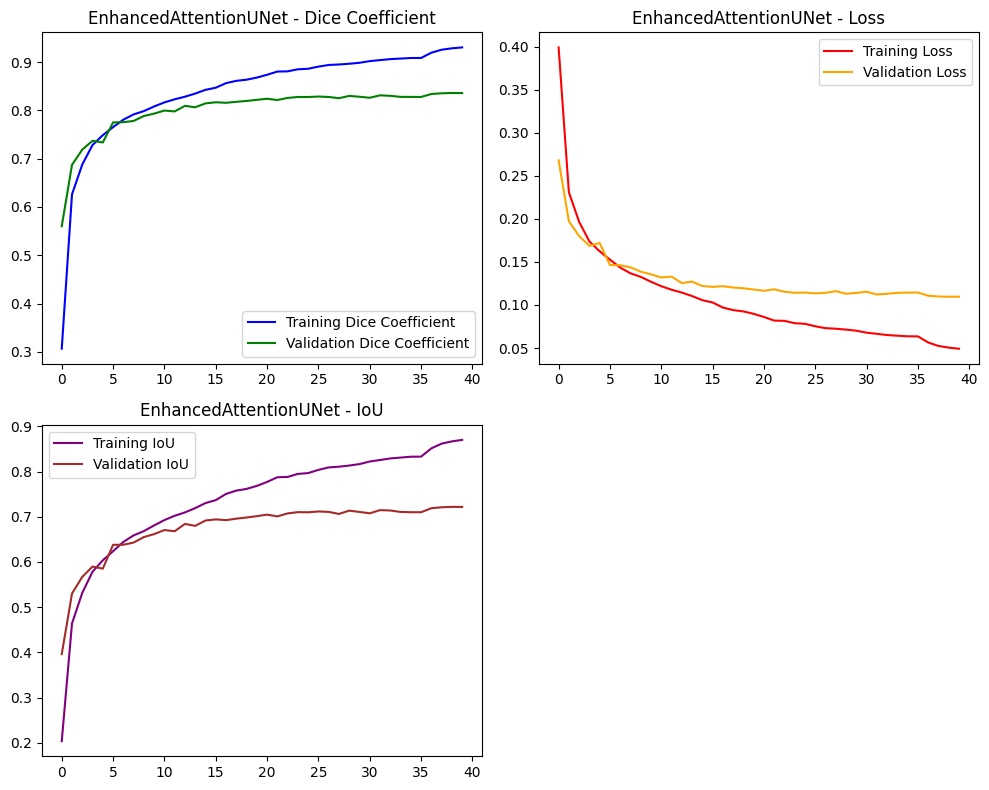

Loaded model state dict from best_EnhancedAttentionUNet.pth.

Test Results:
Loss: 0.1074 | Dice: 0.8459 | IoU: 0.7381
Test metrics saved to test_metrics_EnhancedAttentionUNet.pth
Test Metrics:
{'test_loss': 0.10742553642046625, 'test_dice': 0.8458783868430317, 'test_iou': 0.738077013388924}
Predicted masks shape: (546, 1, 256, 256)


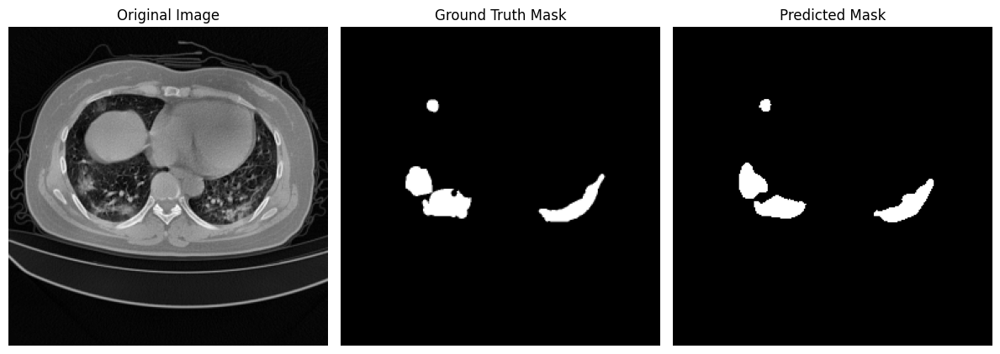

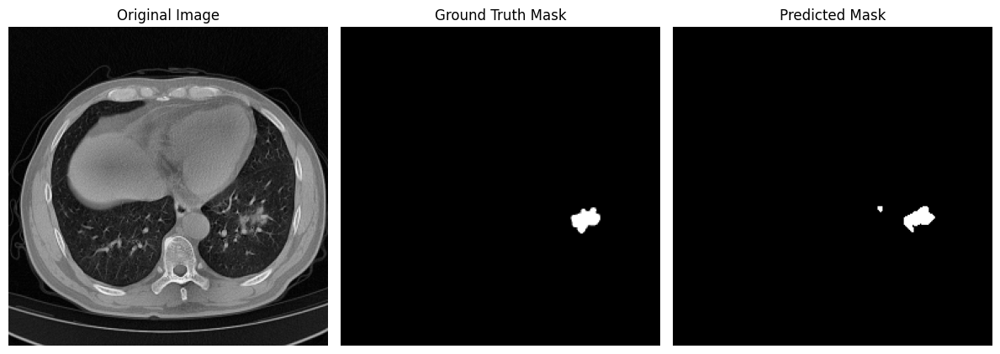

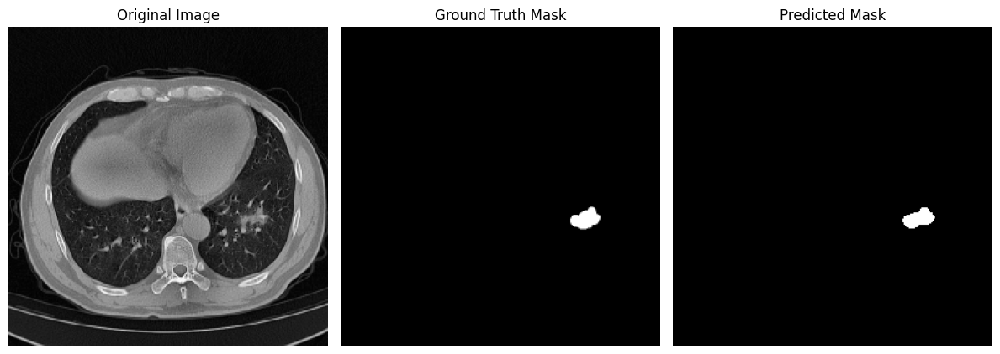

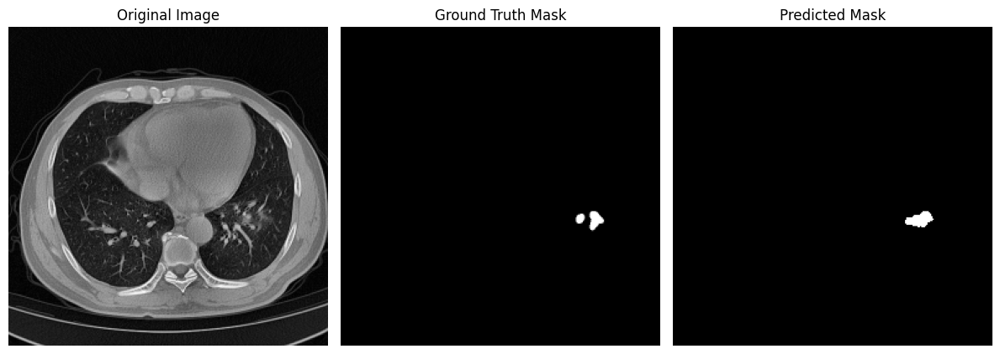

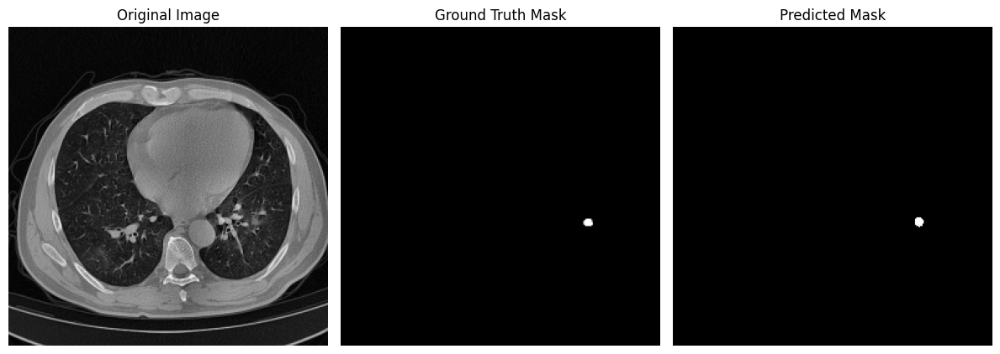

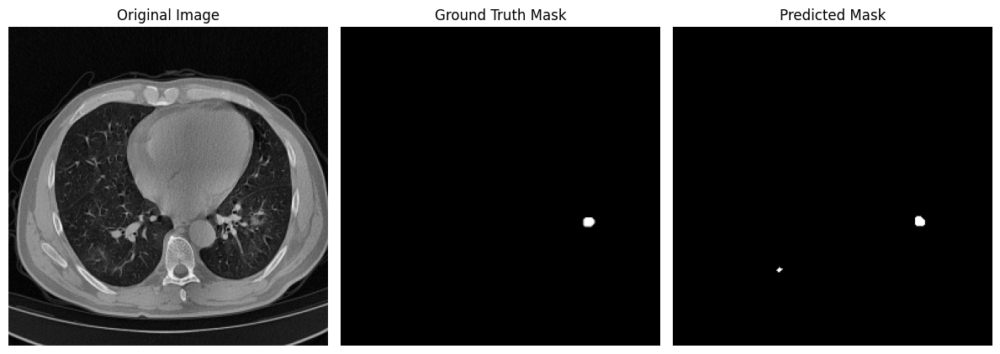

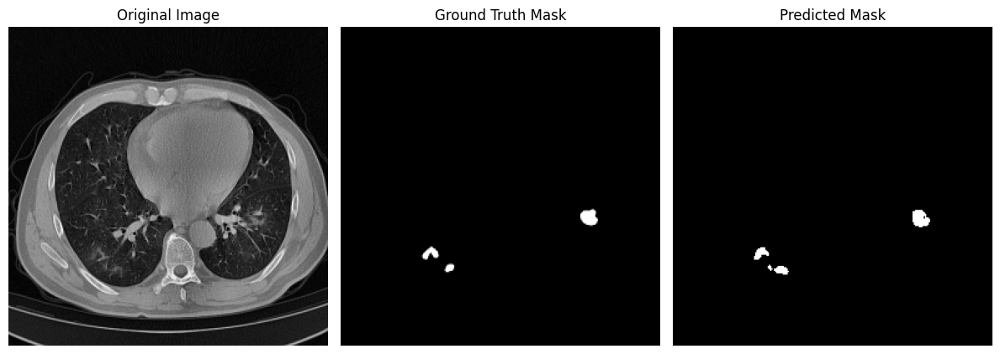

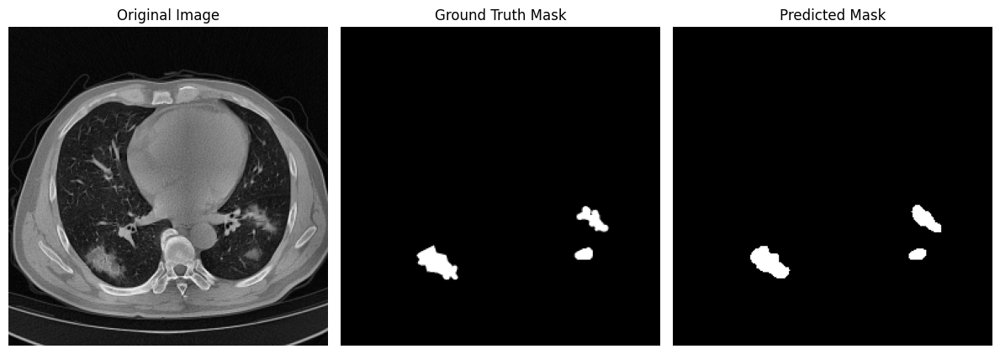

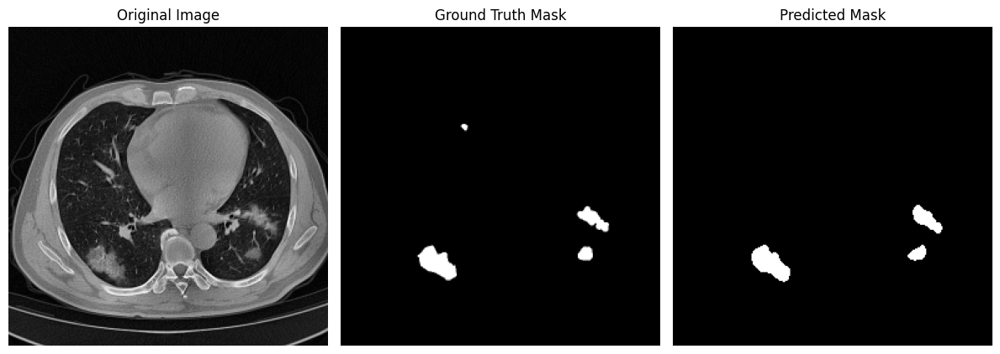

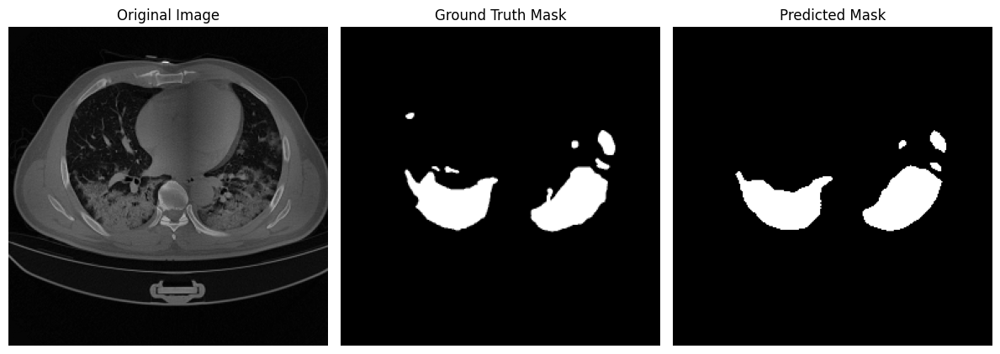

In [29]:

base_dir = os.getcwd()# Update this path accordingly

# Create the data loaders
train_loader, val_loader, test_loader = create_loaders(base_dir, batch_size=8)


modelB = EnhancedAttentionUNet()  # Replace with your model architecture

# training takes around 3.5 mins per epoch  just 40
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelB, train_metrics_B = train_model(train_loader, val_loader, model=modelB, num_epochs=40, accum_steps=4)

visualize_metrics(modelB, train_metrics_B)



test_metrics_B, test_outputs_B = test_loop(
    test_loader, 
    model=modelB, 
    model_path="best_EnhancedAttentionUNet.pth", 
    device=device
)

print("Test Metrics:")
print(test_metrics_B)



predicted_masks = predict_masks(modelB, test_loader, threshold=0.5, device=device, apply_sigmoid=True)

# Optionally, print out the shape or some info about predicted masks
print("Predicted masks shape:", predicted_masks.shape)


visualize_predictions(modelB, test_loader, device=device, num_images=10)


Model 3

In [30]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SEBlock(nn.Module):
    """Squeeze-and-Excitation block for channel attention"""
    def __init__(self, channel, reduction=16):
        super(SEBlock, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction),
            nn.ReLU(inplace=False),  # Avoid inplace operation
            nn.Linear(channel // reduction, channel),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y  # Broadcasting handles multiplication

class ResidualConvBlock(nn.Module):
    """Residual convolutional block with dropout for regularization"""
    def __init__(self, in_ch, out_ch, se=False, dropout_p=0.1):
        super(ResidualConvBlock, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=False)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=False)
        )
        self.dropout = nn.Dropout2d(p=dropout_p)
        self.se = SEBlock(out_ch) if se else None
        self.downsample = nn.Conv2d(in_ch, out_ch, kernel_size=1) if in_ch != out_ch else None

    def forward(self, x):
        residual = x
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.dropout(out)  # Apply dropout for regularization
        if self.se is not None:
            out = self.se(out)
        if self.downsample is not None:
            residual = self.downsample(x)
        out = out + residual
        return F.relu(out, inplace=False)

class ImprovedAttentionGate(nn.Module):
    """Enhanced attention gate with multi-scale features and dropout"""
    def __init__(self, F_g, F_l, F_int, dropout_p=0.1):
        super(ImprovedAttentionGate, self).__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(F_int)
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(F_int)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=False)
        self.multi_scale = nn.Sequential(
            nn.Conv2d(F_int, F_int, kernel_size=3, dilation=2, padding=2),
            nn.BatchNorm2d(F_int),
            nn.ReLU(inplace=False),
            nn.Conv2d(F_int, F_int, kernel_size=3, dilation=3, padding=3),
            nn.BatchNorm2d(F_int),
            nn.ReLU(inplace=False)
        )
        self.dropout = nn.Dropout2d(p=dropout_p)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        combined = self.relu(g1 + x1)
        combined = self.multi_scale(combined)
        combined = self.dropout(combined)
        psi = self.psi(combined)
        return x * psi

class ResUNet(nn.Module):
    def __init__(self, in_ch=1, out_ch=1, dropout_p=0.1):
        super(ResUNet, self).__init__()
        # Encoder path
        self.enc1 = ResidualConvBlock(in_ch, 64, se=True, dropout_p=dropout_p)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = ResidualConvBlock(64, 128, se=True, dropout_p=dropout_p)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = ResidualConvBlock(128, 256, se=True, dropout_p=dropout_p)
        self.pool3 = nn.MaxPool2d(2)
        self.enc4 = ResidualConvBlock(256, 512, se=True, dropout_p=dropout_p)
        self.pool4 = nn.MaxPool2d(2)

        # Bottleneck with additional dropout
        self.bottleneck = nn.Sequential(
            ResidualConvBlock(512, 1024, se=False, dropout_p=dropout_p),
            nn.Conv2d(1024, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=False),
            nn.Dropout2d(p=dropout_p)
        )

        # Decoder path with attention gates
        self.up4 = nn.ConvTranspose2d(512, 512, kernel_size=2, stride=2)
        self.att4 = ImprovedAttentionGate(512, 512, 256, dropout_p=dropout_p)
        self.dec4 = ResidualConvBlock(512 + 512, 512, se=True, dropout_p=dropout_p)

        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.att3 = ImprovedAttentionGate(256, 256, 128, dropout_p=dropout_p)
        self.dec3 = ResidualConvBlock(256 + 256, 256, se=True, dropout_p=dropout_p)

        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.att2 = ImprovedAttentionGate(128, 128, 64, dropout_p=dropout_p)
        self.dec2 = ResidualConvBlock(128 + 128, 128, se=True, dropout_p=dropout_p)

        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.att1 = ImprovedAttentionGate(64, 64, 32, dropout_p=dropout_p)
        self.dec1 = ResidualConvBlock(64 + 64, 64, se=True, dropout_p=dropout_p)

        # Deep supervision outputs for multi-scale training signals
        self.ds4 = nn.Conv2d(512, out_ch, kernel_size=1)
        self.ds3 = nn.Conv2d(256, out_ch, kernel_size=1)
        self.ds2 = nn.Conv2d(128, out_ch, kernel_size=1)

        # Final output: raw logits (no sigmoid activation)
        self.final = nn.Conv2d(64, out_ch, kernel_size=1)

        self._initialize_weights()

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        # Encoder path
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        e3 = self.enc3(self.pool2(e2))
        e4 = self.enc4(self.pool3(e3))

        # Bottleneck
        b = self.bottleneck(self.pool4(e4))

        # Decoder path with attention gates and deep supervision
        d4 = self.up4(b)
        e4_att = self.att4(d4, e4)
        d4 = torch.cat([d4, e4_att], dim=1)
        d4 = self.dec4(d4)
        ds4 = self.ds4(d4)  # Raw logits, no sigmoid

        d3 = self.up3(d4)
        e3_att = self.att3(d3, e3)
        d3 = torch.cat([d3, e3_att], dim=1)
        d3 = self.dec3(d3)
        ds3 = self.ds3(d3)  # Raw logits, no sigmoid

        d2 = self.up2(d3)
        e2_att = self.att2(d2, e2)
        d2 = torch.cat([d2, e2_att], dim=1)
        d2 = self.dec2(d2)
        ds2 = self.ds2(d2)  # Raw logits, no sigmoid

        d1 = self.up1(d2)
        e1_att = self.att1(d1, e1)
        d1 = torch.cat([d1, e1_att], dim=1)
        d1 = self.dec1(d1)

        out = self.final(d1)  # Raw logits, no sigmoid applied
        return out  # Optionally, you can also return (ds4, ds3, ds2) for deep supervision if desired


training and evaluations

Train samples: 5211 | Val samples: 580 | Test samples: 546
Batch size: 8 | Workers: 4 | Augmentations: False
Epoch 1/60 | Train Loss: 0.3307 | Train Dice: 0.4234 | Train IoU: 0.2901 | Val Loss: 0.2232 | Val Dice: 0.6373 | Val IoU: 0.4770
Epoch 2/60 | Train Loss: 0.2114 | Train Dice: 0.6611 | Train IoU: 0.5024 | Val Loss: 0.1716 | Val Dice: 0.7332 | Val IoU: 0.5848
Epoch 3/60 | Train Loss: 0.1757 | Train Dice: 0.7260 | Train IoU: 0.5750 | Val Loss: 0.1535 | Val Dice: 0.7633 | Val IoU: 0.6220
Epoch 4/60 | Train Loss: 0.1595 | Train Dice: 0.7536 | Train IoU: 0.6099 | Val Loss: 0.1458 | Val Dice: 0.7757 | Val IoU: 0.6385
Epoch 5/60 | Train Loss: 0.1490 | Train Dice: 0.7716 | Train IoU: 0.6325 | Val Loss: 0.1368 | Val Dice: 0.7910 | Val IoU: 0.6591
Epoch 6/60 | Train Loss: 0.1405 | Train Dice: 0.7860 | Train IoU: 0.6510 | Val Loss: 0.1323 | Val Dice: 0.7989 | Val IoU: 0.6695
Epoch 7/60 | Train Loss: 0.1323 | Train Dice: 0.7995 | Train IoU: 0.6699 | Val Loss: 0.1294 | Val Dice: 0.8034 | Val 

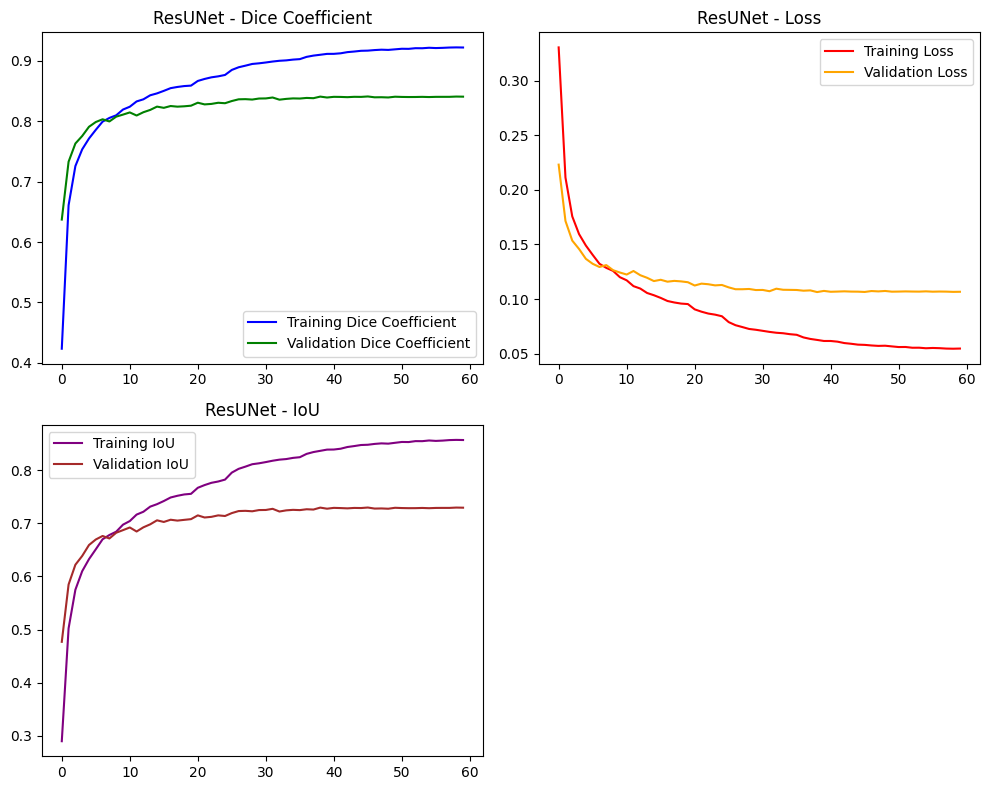

Loaded model state dict from best_ResUNet.pth.

Test Results:
Loss: 0.1028 | Dice: 0.8538 | IoU: 0.7499
Test metrics saved to test_metrics_ResUNet.pth
Test Metrics:
{'test_loss': 0.10275871093398418, 'test_dice': 0.8538391624671825, 'test_iou': 0.7499394563661106}
Predicted masks shape: (546, 1, 256, 256)


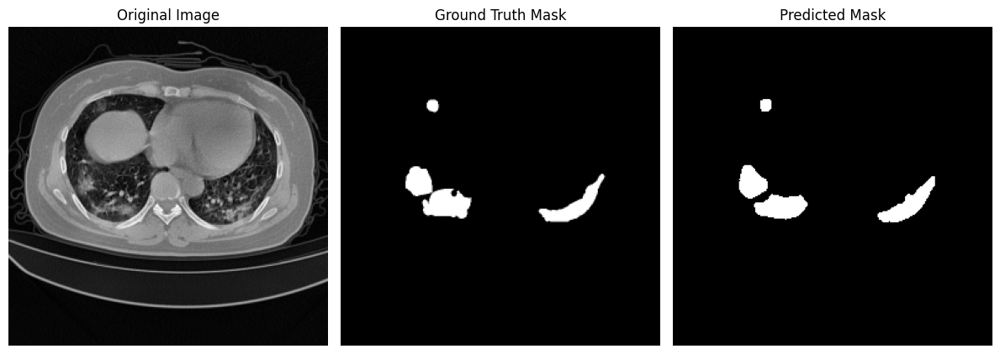

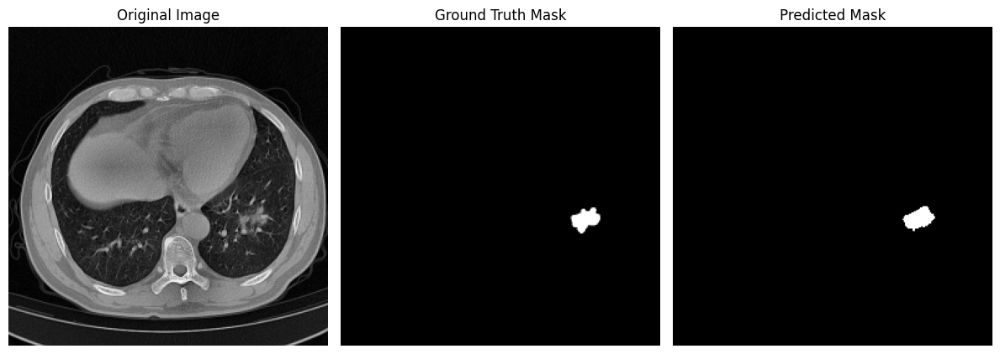

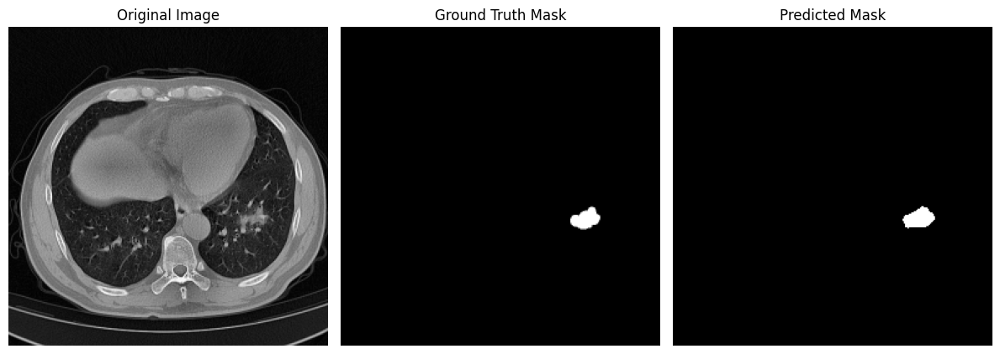

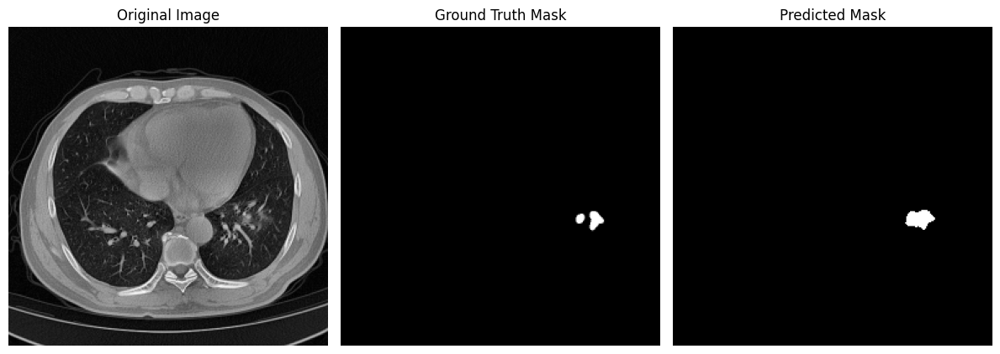

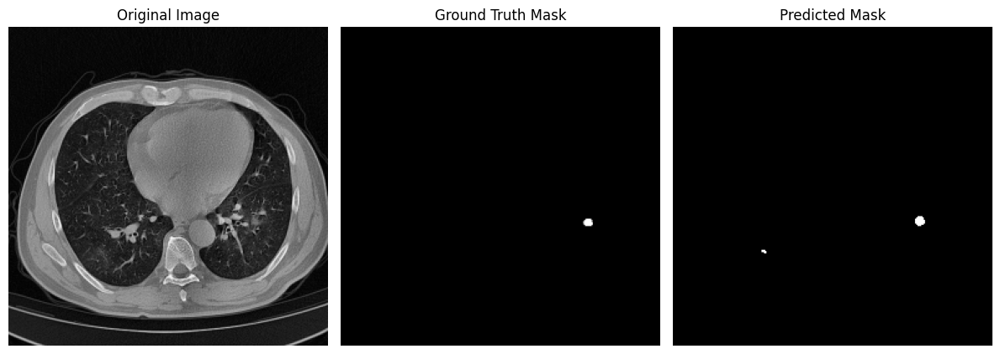

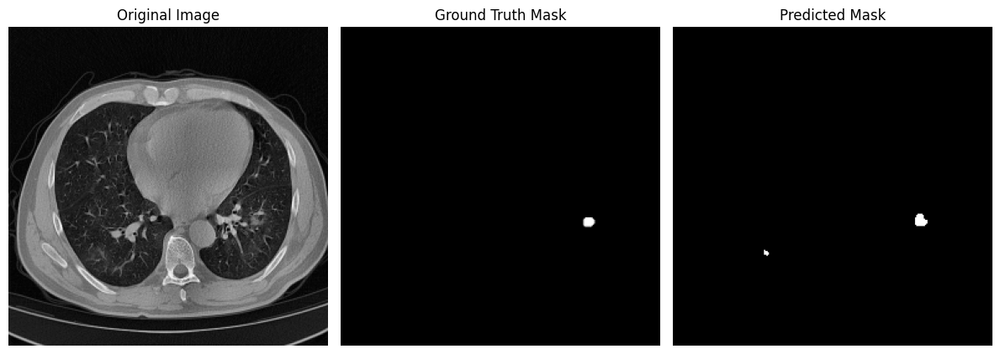

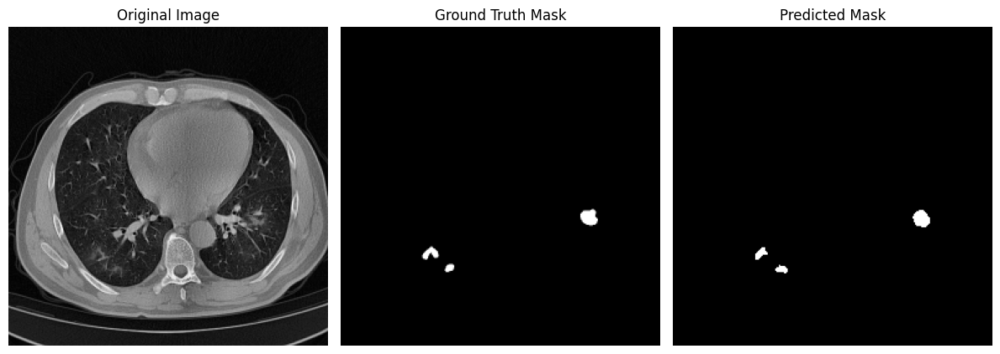

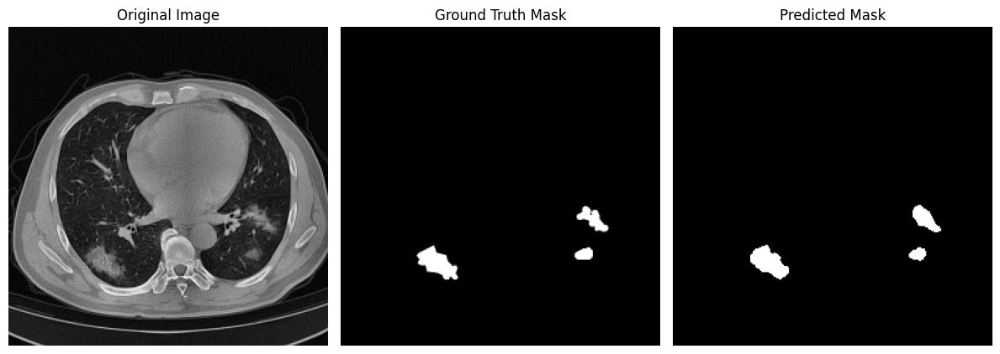

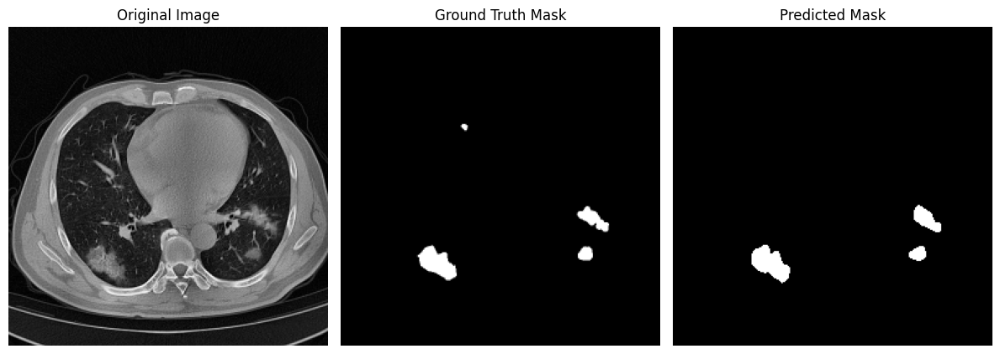

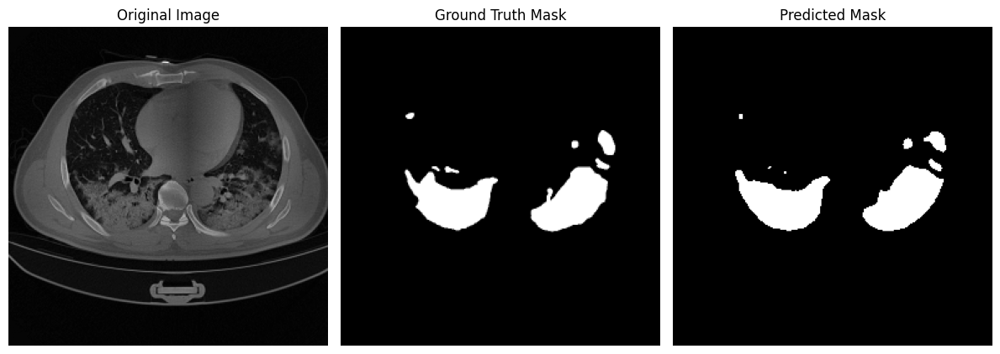

In [31]:


import torch
import matplotlib.pyplot as plt

# ----------------------------------------------------------------
# SETUP: Create DataLoaders and Instantiate modelA
# ----------------------------------------------------------------

# Set the base directory (the parent folder containing the 'augmented_train' and 'augmented_test' folders)
base_dir = os.getcwd()# Update this path accordingly

# Create the data loaders
train_loader, val_loader, test_loader = create_loaders(base_dir, batch_size=8)


modelC =ResUNet()  # Replace with your model architecture

# Choose device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#takes around 1.5 mins,,   55 epochs are enough
modelC, train_metrics_C = train_model(train_loader, val_loader, model=modelC, num_epochs=60, accum_steps=4)


visualize_metrics(modelC, train_metrics_C)


test_metrics_C, test_outputs_C = test_loop(
    test_loader, 
    model=modelC, 
    model_path="best_ResUNet.pth", 
    device=device
)

print("Test Metrics:")
print(test_metrics_C)


predicted_masks = predict_masks(modelC, test_loader, threshold=0.5, device=device, apply_sigmoid=True)

# Optionally, print out the shape or some info about predicted masks
print("Predicted masks shape:", predicted_masks.shape)



visualize_predictions(modelC, test_loader, device=device, num_images=10)


model D

In [32]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Convolutional Block with BatchNorm and Dropout
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.0):
        super(ConvBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.bn1   = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.bn2   = nn.BatchNorm2d(out_channels)
        self.dropout = nn.Dropout2d(dropout) if dropout > 0 else nn.Identity()
        
    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = self.dropout(x)
        x = F.relu(self.bn2(self.conv2(x)))
        return x

# Upsampling layer using transpose convolution
class UpConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UpConv, self).__init__()
        self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        
    def forward(self, x):
        return self.up(x)

# Attention Gate for skip connections
class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        """
        F_g : number of channels in the gating signal (from decoder)
        F_l : number of channels in the skip connection (from encoder)
        F_int : intermediate number of channels (usually set to half of F_l)
        """
        super(AttentionBlock, self).__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, g, x):
        # g: gating signal (from the decoder, coarse features)
        # x: skip connection (from the encoder, fine features)
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

# Modified U-Net with Attention in skip connections
class ImprovedAttentionUNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super(ImprovedAttentionUNet, self).__init__()
        # Encoder
        self.conv1 = ConvBlock(in_channels, 64, dropout=0.1)
        self.pool1 = nn.MaxPool2d(2)
        self.conv2 = ConvBlock(64, 128, dropout=0.1)
        self.pool2 = nn.MaxPool2d(2)
        self.conv3 = ConvBlock(128, 256, dropout=0.2)
        self.pool3 = nn.MaxPool2d(2)
        self.conv4 = ConvBlock(256, 512, dropout=0.2)
        self.pool4 = nn.MaxPool2d(2)
        self.conv5 = ConvBlock(512, 1024, dropout=0.3)
        
        # Decoder
        self.up4 = UpConv(1024, 512)
        self.att4 = AttentionBlock(F_g=512, F_l=512, F_int=256)
        self.conv4d = ConvBlock(1024, 512, dropout=0.2)
        
        self.up3 = UpConv(512, 256)
        self.att3 = AttentionBlock(F_g=256, F_l=256, F_int=128)
        self.conv3d = ConvBlock(512, 256, dropout=0.2)
        
        self.up2 = UpConv(256, 128)
        self.att2 = AttentionBlock(F_g=128, F_l=128, F_int=64)
        self.conv2d = ConvBlock(256, 128, dropout=0.1)
        
        self.up1 = UpConv(128, 64)
        self.att1 = AttentionBlock(F_g=64, F_l=64, F_int=32)
        self.conv1d = ConvBlock(128, 64, dropout=0.1)
        
        self.out_conv = nn.Conv2d(64, out_channels, kernel_size=1)
        
    def forward(self, x):
        # Encoder path
        c1 = self.conv1(x)  # -> [B, 64, H, W]
        p1 = self.pool1(c1)
        
        c2 = self.conv2(p1)  # -> [B, 128, H/2, W/2]
        p2 = self.pool2(c2)
        
        c3 = self.conv3(p2)  # -> [B, 256, H/4, W/4]
        p3 = self.pool3(c3)
        
        c4 = self.conv4(p3)  # -> [B, 512, H/8, W/8]
        p4 = self.pool4(c4)
        
        c5 = self.conv5(p4)  # Bottleneck: [B, 1024, H/16, W/16]
        
        # Decoder path with Attention
        u4 = self.up4(c5)   # Upsample -> [B, 512, H/8, W/8]
        a4 = self.att4(g=u4, x=c4)
        merge4 = torch.cat([u4, a4], dim=1)  # Concatenate -> [B, 1024, H/8, W/8]
        c4d = self.conv4d(merge4)             # -> [B, 512, H/8, W/8]
        
        u3 = self.up3(c4d)   # -> [B, 256, H/4, W/4]
        a3 = self.att3(g=u3, x=c3)
        merge3 = torch.cat([u3, a3], dim=1)   # -> [B, 512, H/4, W/4]
        c3d = self.conv3d(merge3)             # -> [B, 256, H/4, W/4]
        
        u2 = self.up2(c3d)   # -> [B, 128, H/2, W/2]
        a2 = self.att2(g=u2, x=c2)
        merge2 = torch.cat([u2, a2], dim=1)   # -> [B, 256, H/2, W/2]
        c2d = self.conv2d(merge2)             # -> [B, 128, H/2, W/2]
        
        u1 = self.up1(c2d)   # -> [B, 64, H, W]
        a1 = self.att1(g=u1, x=c1)
        merge1 = torch.cat([u1, a1], dim=1)   # -> [B, 128, H, W]
        c1d = self.conv1d(merge1)             # -> [B, 64, H, W]
        
        out = self.out_conv(c1d)              # -> [B, out_channels, H, W]
        #out = torch.sigmoid(out)              # Apply sigmoid to map outputs to [0,1]
        return out

#takes aroun 1:40 


Train samples: 5211 | Val samples: 580 | Test samples: 546
Batch size: 8 | Workers: 4 | Augmentations: False
Epoch 1/75 | Train Loss: 0.5303 | Train Dice: 0.2349 | Train IoU: 0.1457 | Val Loss: 0.5135 | Val Dice: 0.3341 | Val IoU: 0.2068
Epoch 2/75 | Train Loss: 0.5014 | Train Dice: 0.4370 | Train IoU: 0.2934 | Val Loss: 0.4897 | Val Dice: 0.5752 | Val IoU: 0.4087
Epoch 3/75 | Train Loss: 0.4817 | Train Dice: 0.5038 | Train IoU: 0.3508 | Val Loss: 0.4692 | Val Dice: 0.5909 | Val IoU: 0.4249
Epoch 4/75 | Train Loss: 0.4581 | Train Dice: 0.5628 | Train IoU: 0.4035 | Val Loss: 0.4416 | Val Dice: 0.6733 | Val IoU: 0.5138
Epoch 5/75 | Train Loss: 0.4243 | Train Dice: 0.6147 | Train IoU: 0.4543 | Val Loss: 0.4010 | Val Dice: 0.6695 | Val IoU: 0.5111
Epoch 6/75 | Train Loss: 0.3750 | Train Dice: 0.6695 | Train IoU: 0.5129 | Val Loss: 0.3449 | Val Dice: 0.7287 | Val IoU: 0.5789
Epoch 7/75 | Train Loss: 0.3169 | Train Dice: 0.7096 | Train IoU: 0.5571 | Val Loss: 0.2843 | Val Dice: 0.7580 | Val 

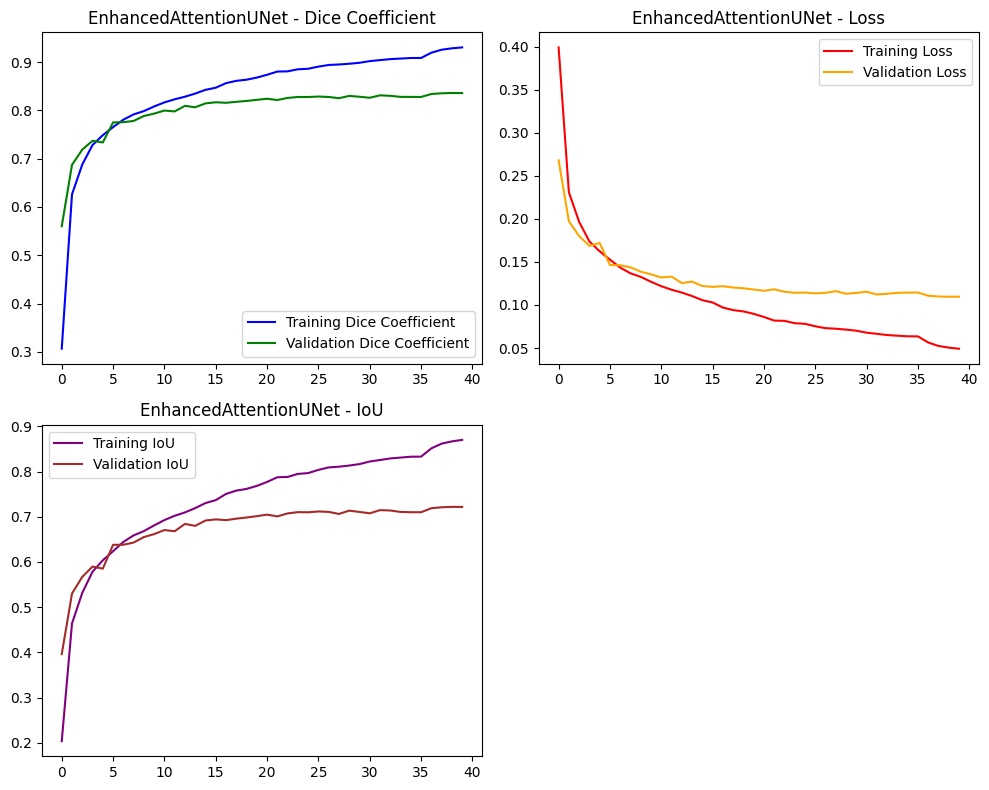

Loaded model state dict from best_ImprovedAttentionUNet.pth.

Test Results:
Loss: 0.1013 | Dice: 0.8534 | IoU: 0.7493
Test metrics saved to test_metrics_ImprovedAttentionUNet.pth
Test Metrics:
{'test_loss': 0.10127370437418205, 'test_dice': 0.8534402018008025, 'test_iou': 0.749257877253104}
Predicted masks shape: (546, 1, 256, 256)


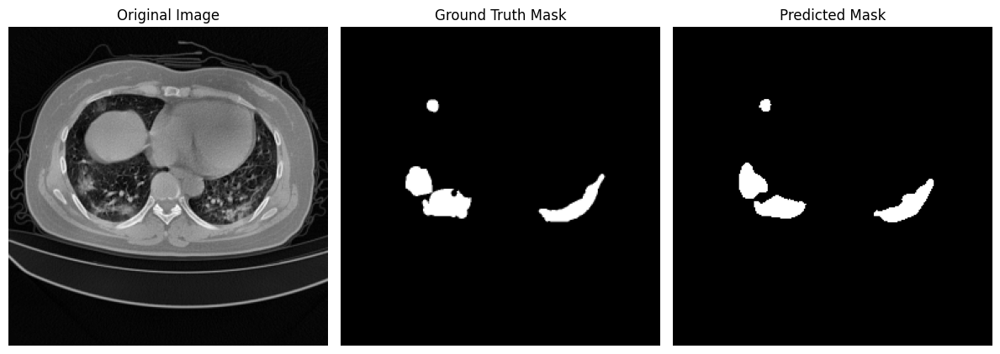

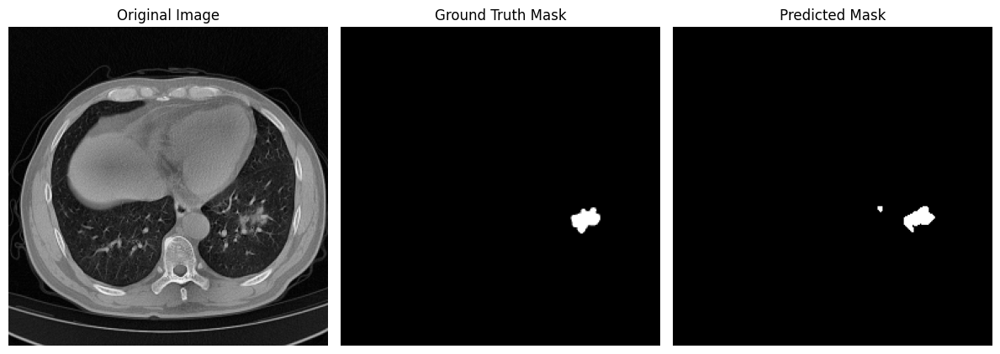

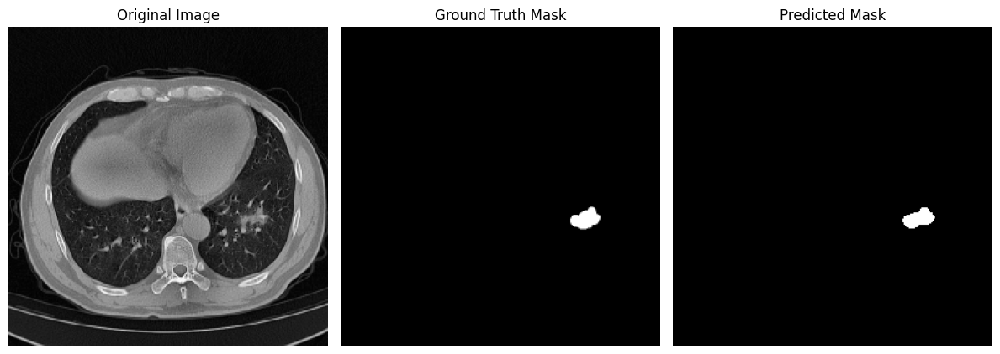

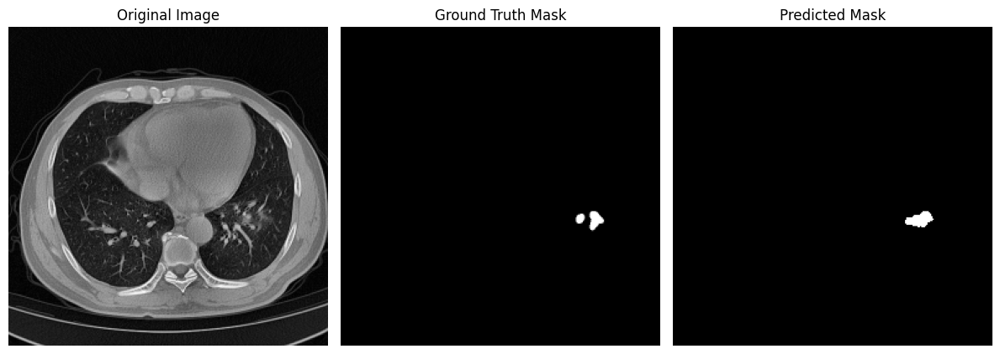

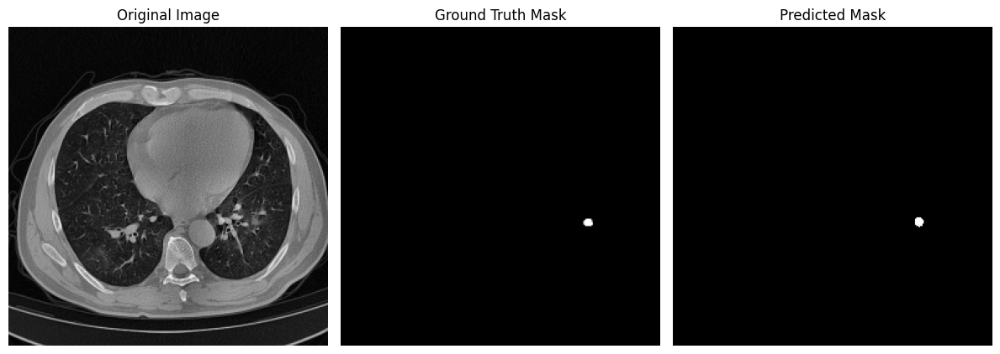

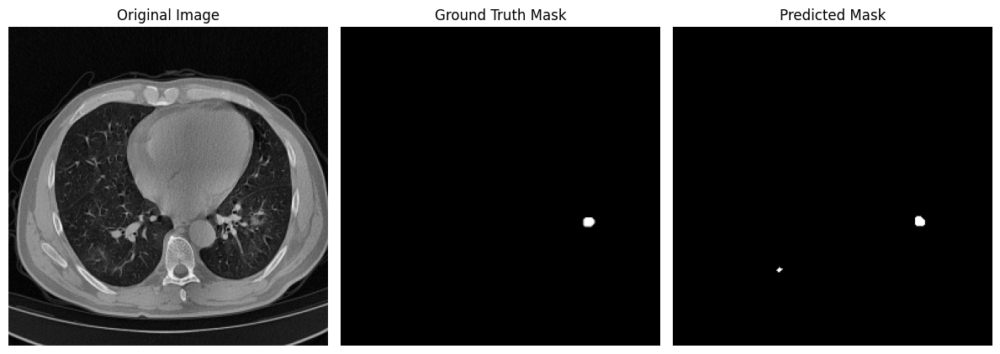

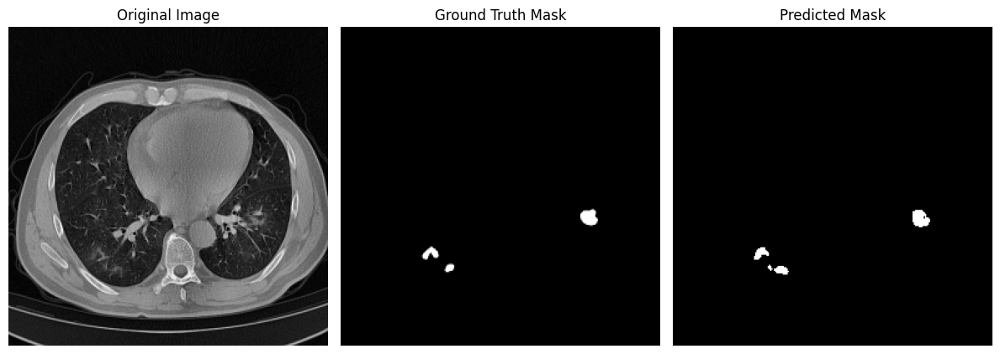

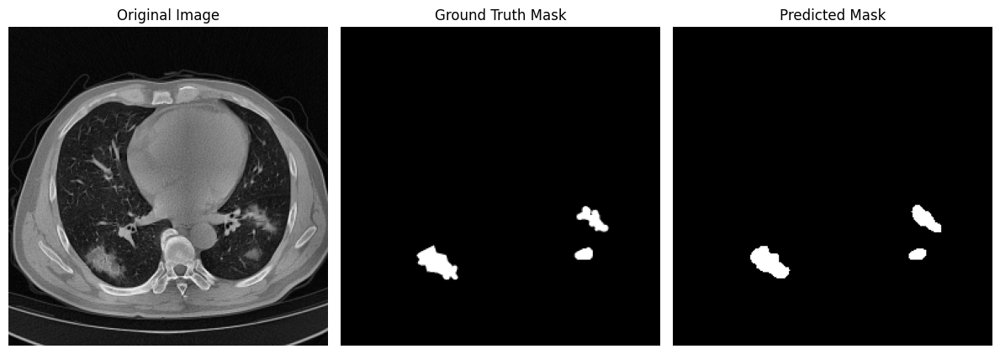

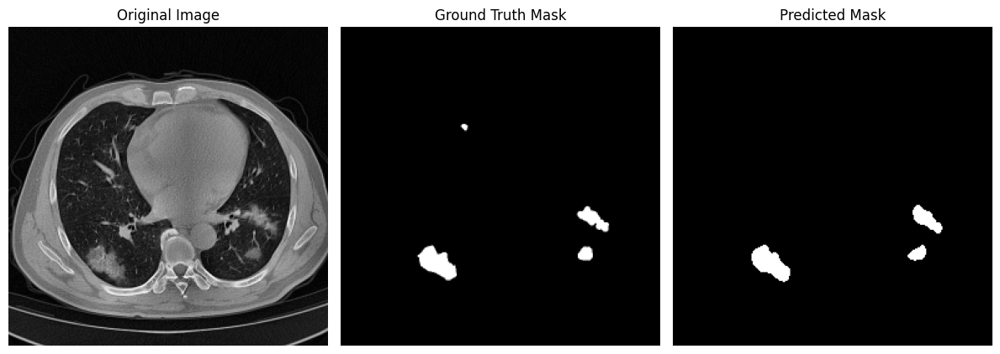

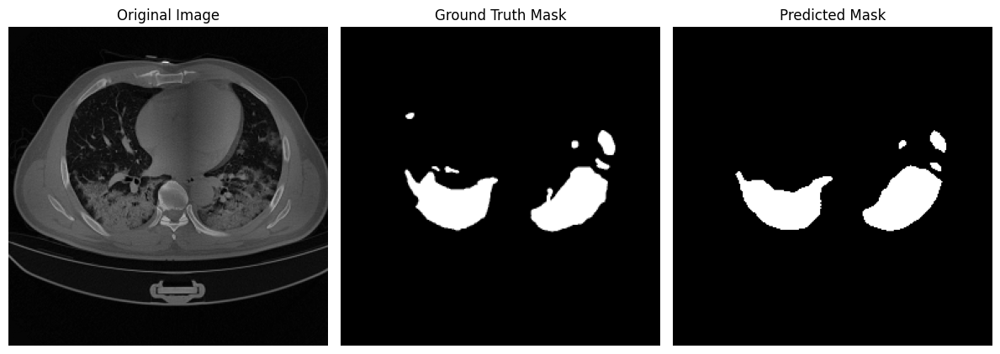

In [33]:

base_dir = os.getcwd()# Update this path accordingly

# Create the data loaders
train_loader, val_loader, test_loader = create_loaders(base_dir, batch_size=8)


modelD = ImprovedAttentionUNet()  # Replace with your model architecture

# Choose device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ----------------------------------------------------------------
# 1. TRAINING: Train the model with training and validation
# ----------------------------------------------------------------

#takes around 1 min per epoch  wwas 70
modelD, train_metrics_D = train_model(train_loader, val_loader, model=modelD, num_epochs=75, accum_steps=4)

visualize_metrics(modelB, train_metrics_B)


test_metrics_D, test_outputs_D = test_loop(
    test_loader, 
    model=modelD, 
    model_path="best_ImprovedAttentionUNet.pth", 
    device=device
)

print("Test Metrics:")
print(test_metrics_D)



predicted_masks = predict_masks(modelD, test_loader, threshold=0.5, device=device, apply_sigmoid=True)

# Optionally, print out the shape or some info about predicted masks
print("Predicted masks shape:", predicted_masks.shape)


visualize_predictions(modelB, test_loader, device=device, num_images=10)



model E

In [34]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# ----------------------------------------
# 1) Squeeze-and-Excitation (SE) Block
# ----------------------------------------
class SEBlock(nn.Module):
    def __init__(self, channels, reduction=16):
        super().__init__()
        self.fc1 = nn.Conv2d(channels, channels // reduction, 1)
        self.fc2 = nn.Conv2d(channels // reduction, channels, 1)

    def forward(self, x):
        # Global pooling
        s = F.adaptive_avg_pool2d(x, 1)
        s = F.relu(self.fc1(s), inplace=True)
        s = torch.sigmoid(self.fc2(s))
        return x * s

# ----------------------------------------
# 2) Spatial Attention (as in CBAM)
# ----------------------------------------
class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super().__init__()
        self.conv = nn.Conv2d(2, 1, kernel_size, padding=kernel_size//2, bias=False)

    def forward(self, x):
        avg = x.mean(dim=1, keepdim=True)
        mx  = x.max(dim=1, keepdim=True)[0]
        m = torch.cat([avg, mx], dim=1)
        attn = torch.sigmoid(self.conv(m))
        return x * attn

# ----------------------------------------
# 3) Enhanced ConvBlock w/ SE + SPA
# ----------------------------------------
class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch, dropout=0.1):
        super().__init__()
        self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
        self.bn1   = nn.BatchNorm2d(out_ch)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bn2   = nn.BatchNorm2d(out_ch)
        self.drop  = nn.Dropout2d(dropout)
        self.se    = SEBlock(out_ch)
        self.sa    = SpatialAttention()

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)), inplace=True)
        x = self.drop(x)
        x = F.relu(self.bn2(self.conv2(x)), inplace=True)
        x = self.se(x)
        x = self.sa(x)
        return x

# ----------------------------------------
class SelfAttentionBottleneck(nn.Module):
    def __init__(self, in_ch, num_heads=4):
        super().__init__()
        self.qkv = nn.Conv2d(in_ch, in_ch * 3, 1, bias=False)
        self.proj = nn.Conv2d(in_ch, in_ch, 1)
        self.num_heads = num_heads

    def forward(self, x):
        B, C, H, W = x.shape
        qkv = self.qkv(x).reshape(B, 3, self.num_heads, C // self.num_heads, H*W)
        q, k, v = qkv[:,0], qkv[:,1], qkv[:,2]       # each [B, heads, C/heads, N]
        attn = torch.einsum('bhcn,bhkn->bhnk', q, k) / (C//self.num_heads)**0.5
        attn = F.softmax(attn, dim=-1)
        out = torch.einsum('bhnk,bhcn->bhcn', attn, v).reshape(B, C, H, W)
        return self.proj(out) + x

# ----------------------------------------
# 5) Up-Conv and AttentionSkip (unchanged)
# ----------------------------------------
class UpConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_ch, out_ch, 2, 2)
    def forward(self, x):
        return self.up(x)

class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super().__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, 1), nn.BatchNorm2d(F_int))
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, 1), nn.BatchNorm2d(F_int))
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, 1), nn.BatchNorm2d(1), nn.Sigmoid())
        self.relu = nn.ReLU(inplace=True)
    def forward(self, g, x):
        g1 = self.W_g(g); x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

# ----------------------------------------
# 6) Enhanced TransUNet
# ----------------------------------------
class ModifiedUNet(nn.Module):
    def __init__(self, in_ch=1, out_ch=1):
        super().__init__()
        # Encoder
        self.conv1 = ConvBlock(in_ch,  64, dropout=0.1)
        self.pool1 = nn.MaxPool2d(2)
        self.conv2 = ConvBlock(64,    128, dropout=0.1)
        self.pool2 = nn.MaxPool2d(2)
        self.conv3 = ConvBlock(128,   256, dropout=0.2)
        self.pool3 = nn.MaxPool2d(2)
        self.conv4 = ConvBlock(256,   512, dropout=0.2)
        self.pool4 = nn.MaxPool2d(2)
        self.conv5 = ConvBlock(512,  1024, dropout=0.3)

        # Self-Attention Bottleneck
        self.attn_bot = SelfAttentionBottleneck(1024, num_heads=8)

        # Decoder
        self.up4   = UpConv(1024, 512)
        self.att4  = AttentionBlock(512, 512, 256)
        self.conv4d= ConvBlock(1024, 512, dropout=0.2)

        self.up3   = UpConv(512, 256)
        self.att3  = AttentionBlock(256, 256, 128)
        self.conv3d= ConvBlock(512, 256, dropout=0.2)

        self.up2   = UpConv(256, 128)
        self.att2  = AttentionBlock(128, 128, 64)
        self.conv2d= ConvBlock(256, 128, dropout=0.1)

        self.up1   = UpConv(128,  64)
        self.att1  = AttentionBlock(64,  64,  32)
        self.conv1d= ConvBlock(128,  64,  dropout=0.1)

        self.out_conv = nn.Conv2d(64, out_ch, 1)

    def forward(self, x):
        # encode
        c1 = self.conv1(x); p1 = self.pool1(c1)
        c2 = self.conv2(p1); p2 = self.pool2(c2)
        c3 = self.conv3(p2); p3 = self.pool3(c3)
        c4 = self.conv4(p3); p4 = self.pool4(c4)
        c5 = self.conv5(p4)

        # bottleneck attention
        b  = self.attn_bot(c5)

        # decode
        u4 = self.up4(b); a4 = self.att4(u4, c4); m4 = torch.cat([u4,a4],1); c4d = self.conv4d(m4)
        u3 = self.up3(c4d); a3 = self.att3(u3, c3); m3 = torch.cat([u3,a3],1); c3d = self.conv3d(m3)
        u2 = self.up2(c3d); a2 = self.att2(u2, c2); m2 = torch.cat([u2,a2],1); c2d = self.conv2d(m2)
        u1 = self.up1(c2d); a1 = self.att1(u1, c1); m1 = torch.cat([u1,a1],1); c1d = self.conv1d(m1)

        out = self.out_conv(c1d)
        return out
#takes around 2 mins 


Train samples: 5211 | Val samples: 580 | Test samples: 546
Batch size: 8 | Workers: 4 | Augmentations: False
Epoch 1/60 | Train Loss: 0.5551 | Train Dice: 0.2758 | Train IoU: 0.1751 | Val Loss: 0.5456 | Val Dice: 0.5032 | Val IoU: 0.3489
Epoch 2/60 | Train Loss: 0.5323 | Train Dice: 0.5009 | Train IoU: 0.3468 | Val Loss: 0.5168 | Val Dice: 0.5945 | Val IoU: 0.4285
Epoch 3/60 | Train Loss: 0.5034 | Train Dice: 0.5464 | Train IoU: 0.3870 | Val Loss: 0.4904 | Val Dice: 0.5912 | Val IoU: 0.4254
Epoch 4/60 | Train Loss: 0.4764 | Train Dice: 0.5709 | Train IoU: 0.4100 | Val Loss: 0.4567 | Val Dice: 0.6840 | Val IoU: 0.5263
Epoch 5/60 | Train Loss: 0.4373 | Train Dice: 0.6185 | Train IoU: 0.4580 | Val Loss: 0.4051 | Val Dice: 0.7216 | Val IoU: 0.5689
Epoch 6/60 | Train Loss: 0.3702 | Train Dice: 0.6825 | Train IoU: 0.5271 | Val Loss: 0.3260 | Val Dice: 0.7428 | Val IoU: 0.5971
Epoch 7/60 | Train Loss: 0.2913 | Train Dice: 0.7330 | Train IoU: 0.5849 | Val Loss: 0.2526 | Val Dice: 0.7618 | Val 

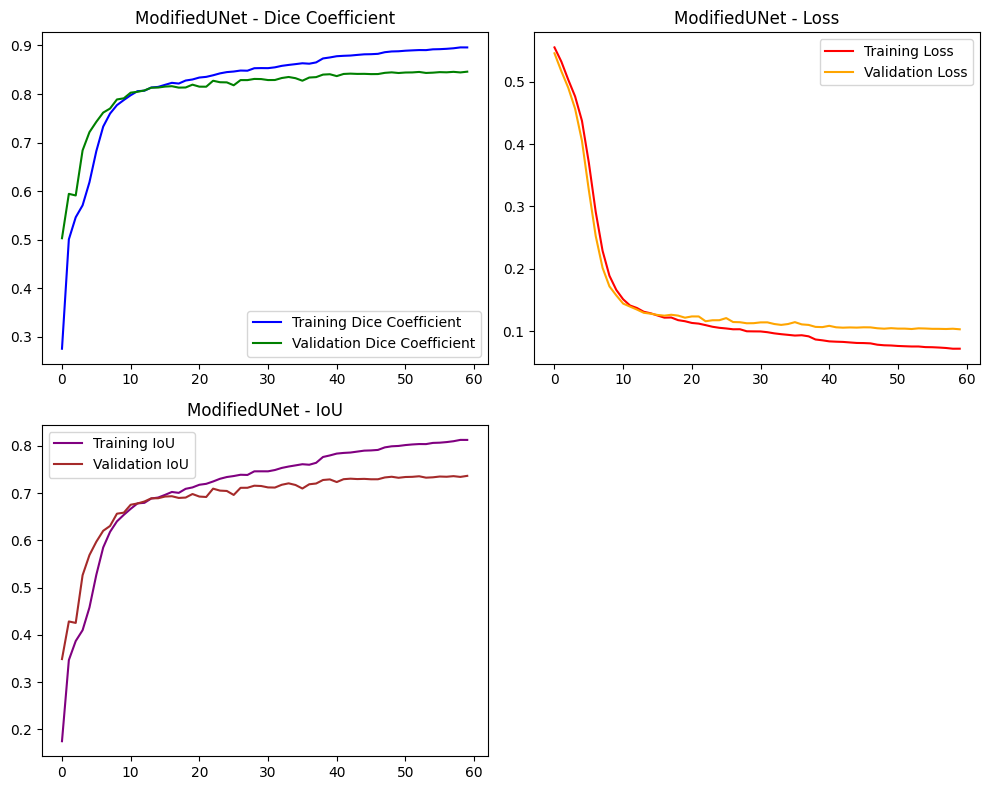

In [35]:

base_dir = os.getcwd()# Update this path accordingly

# Create the data loaders
train_loader, val_loader, test_loader = create_loaders(base_dir, batch_size=8)


modelE = ModifiedUNet()  # Replace with your model architecture

# Choose device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ----------------------------------------------------------------
# 1. TRAINING: Train the model with training and validation
# ----------------------------------------------------------------

# The train_model function should accept the train and validation loaders,  was 50
# your model (modelA) and parameters such as number of epochs and gradient accumulation steps.
modelE, train_metrics_E = train_model(train_loader, val_loader, model=modelE, num_epochs=60, accum_steps=4)

visualize_metrics(modelE, train_metrics_E)



Loaded model state dict from best_ModifiedUNet.pth.

Test Results:
Loss: 0.1004 | Dice: 0.8551 | IoU: 0.7518
Test metrics saved to test_metrics_ModifiedUNet.pth
Test Metrics:
{'test_loss': 0.1004278128021869, 'test_dice': 0.8551265424576359, 'test_iou': 0.7517673468244248}
Predicted masks shape: (546, 1, 256, 256)


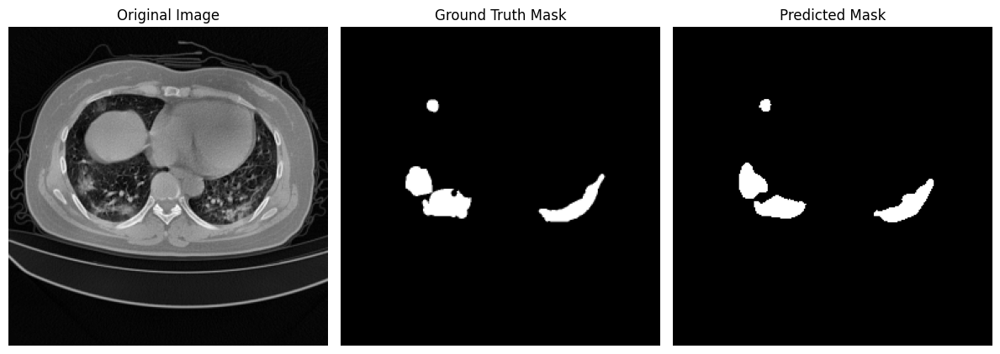

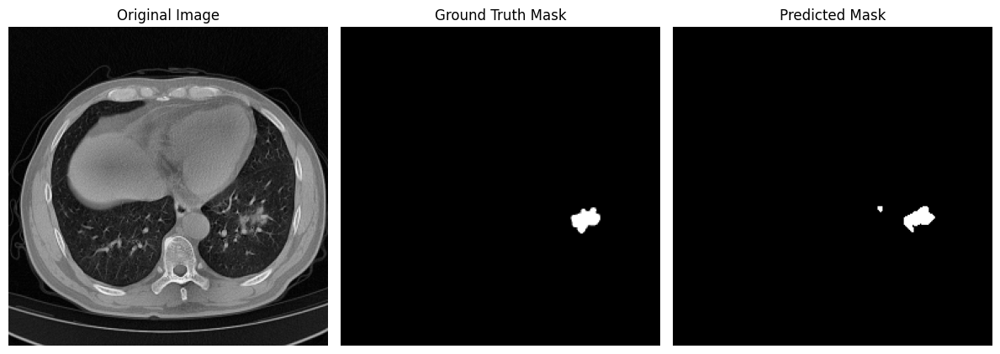

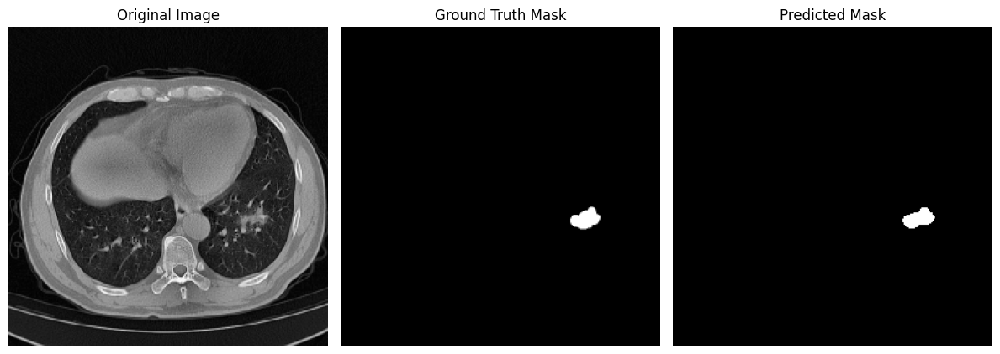

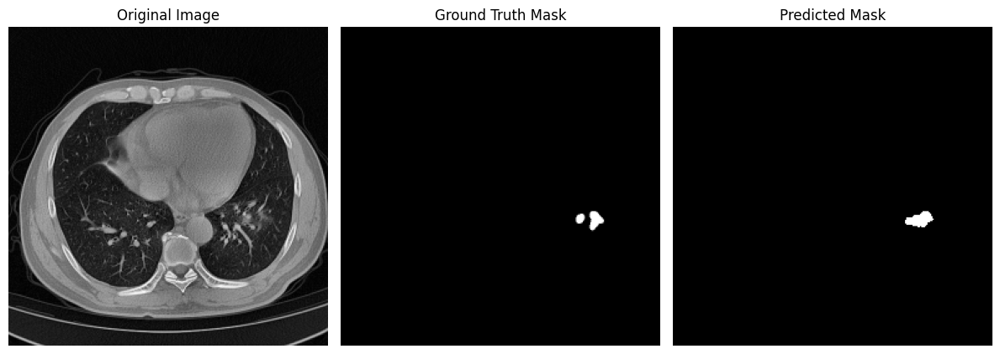

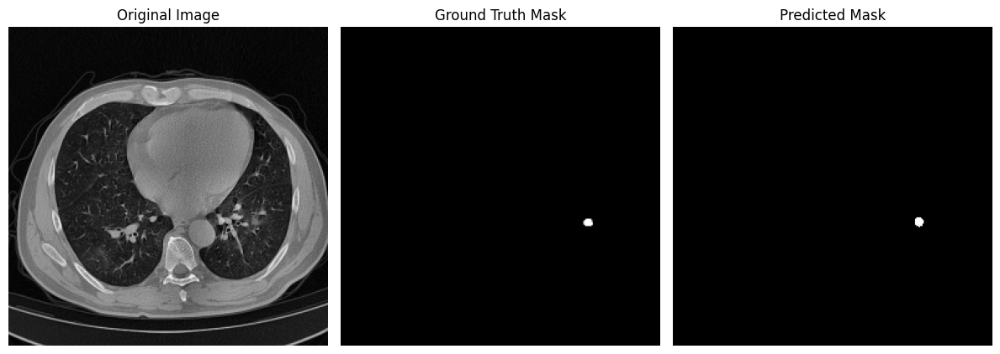

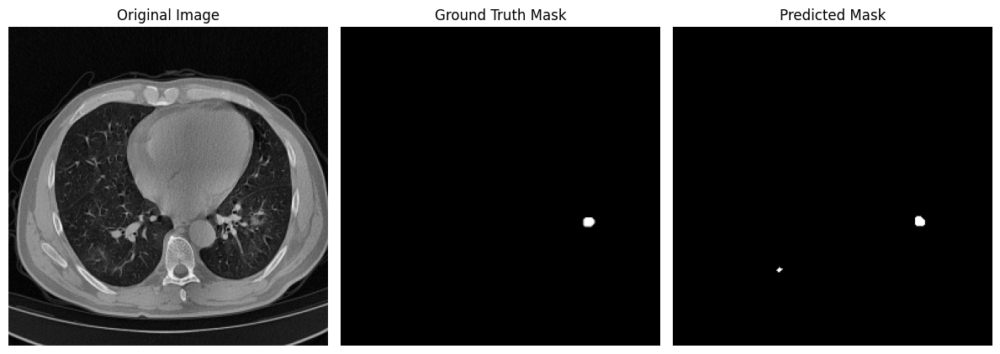

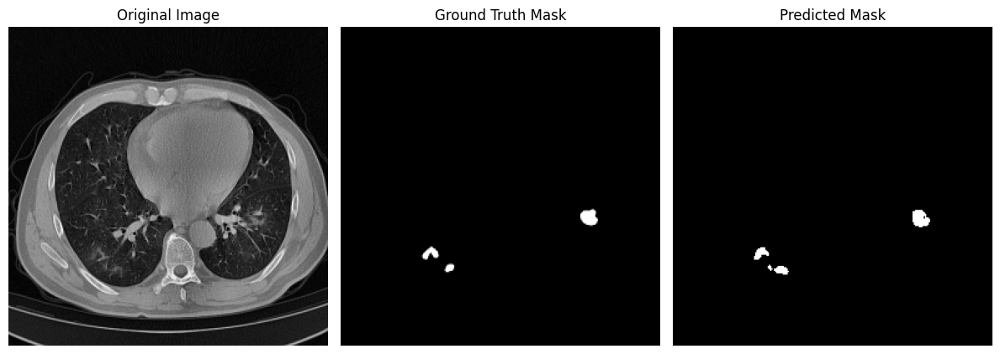

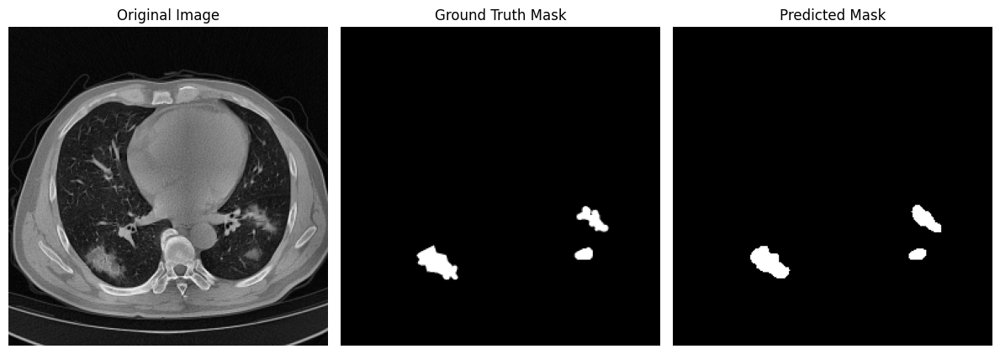

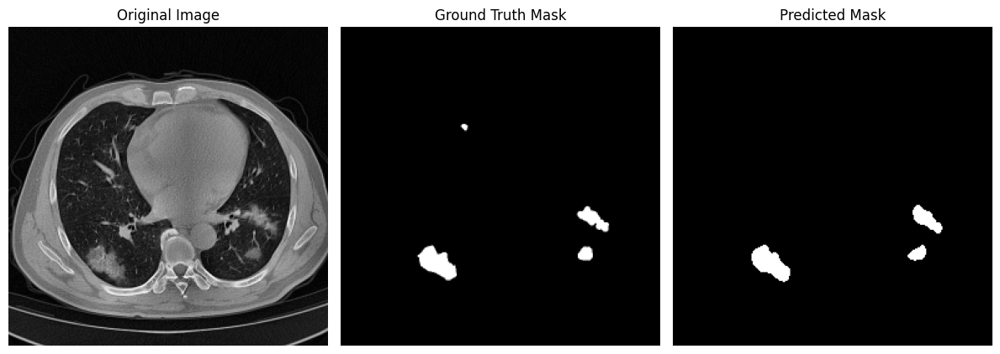

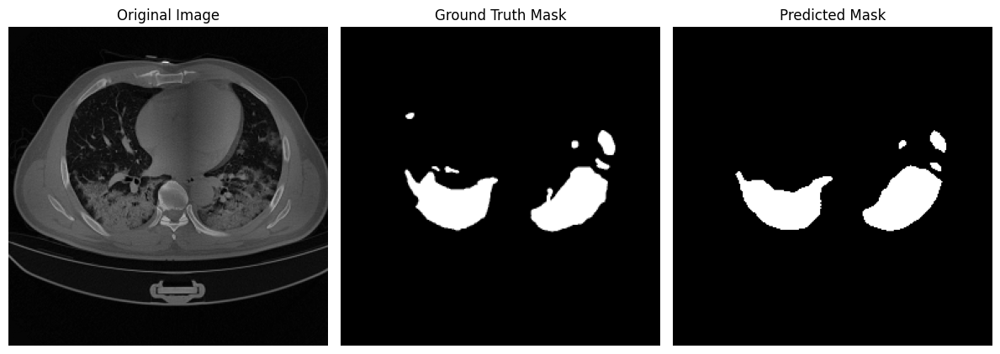

In [36]:
test_metrics_E, test_outputs_E = test_loop(
    test_loader, 
    model=modelE, 
    model_path="best_ModifiedUNet.pth", 
    device=device
)

print("Test Metrics:")
print(test_metrics_E)



predicted_masks = predict_masks(modelE, test_loader, threshold=0.5, device=device, apply_sigmoid=True)

# Optionally, print out the shape or some info about predicted masks
print("Predicted masks shape:", predicted_masks.shape)


visualize_predictions(modelB, test_loader, device=device, num_images=10)

Clear memory 


In [37]:

"""
import subprocess

result = subprocess.run(["nvidia-smi"], capture_output=True, text=True)
print(result.stdout)
"""

'\nimport subprocess\n\nresult = subprocess.run(["nvidia-smi"], capture_output=True, text=True)\nprint(result.stdout)\n'

In [38]:
"""
import os
import signal

# Replace this with the PID you want to kill
pid_to_kill = 291974

try:
    # First, try to terminate gracefully with SIGTERM
    os.kill(pid_to_kill, signal.SIGTERM)
    print(f"Process {pid_to_kill} terminated with SIGTERM.")
    
    # Optionally, if the process does not exit, you can force it:
    # os.kill(pid_to_kill, signal.SIGKILL)
    # print(f"Process {pid_to_kill} killed with SIGKILL.")
except ProcessLookupError:
    print(f"No process found with PID {pid_to_kill}.")
except PermissionError:
    print(f"Permission denied: unable to kill process {pid_to_kill}.")
except Exception as e:
    print(f"An error occurred: {e}")
"""

'\nimport os\nimport signal\n\n# Replace this with the PID you want to kill\npid_to_kill = 291974\n\ntry:\n    # First, try to terminate gracefully with SIGTERM\n    os.kill(pid_to_kill, signal.SIGTERM)\n    print(f"Process {pid_to_kill} terminated with SIGTERM.")\n    \n    # Optionally, if the process does not exit, you can force it:\n    # os.kill(pid_to_kill, signal.SIGKILL)\n    # print(f"Process {pid_to_kill} killed with SIGKILL.")\nexcept ProcessLookupError:\n    print(f"No process found with PID {pid_to_kill}.")\nexcept PermissionError:\n    print(f"Permission denied: unable to kill process {pid_to_kill}.")\nexcept Exception as e:\n    print(f"An error occurred: {e}")\n'

weight initializer for testing best weights

In [39]:
"""
import numpy as np
import torch
import torch.optim as optim

# Candidate weight combinations.
# Each dictionary represents: {focal_weight, dice_weight, iou_weight, bce_weight}
weight_combinations = [
    {"focal_weight": 0.1,  "dice_weight": 0.7, "iou_weight": 0.15, "bce_weight": 0.05},  # Emphasize Dice harder
    {"focal_weight": 0.65, "dice_weight": 0.3, "iou_weight": 0.05,  "bce_weight": 0.0},  # Emphasize Focal more for hard examples
    {"focal_weight": 0.15,  "dice_weight": 0.2, "iou_weight": 0.7,  "bce_weight": 0.05},   #{'focal_weight': 0.2, 'dice_weight': 0.2, 'iou_weight': 0.6, 'bce_weight': 0.0}
    {"focal_weight": 0.05,  "dice_weight": 0.1, "iou_weight": 0.05,  "bce_weight": 0.8},  
    {"focal_weight": 0.1,  "dice_weight": 0.3, "iou_weight": 0.1,  "bce_weight": 0.5},
    {"focal_weight": 0.3,  "dice_weight": 0.3, "iou_weight": 0.3,  "bce_weight": 0.1}      # Drop IoU
]     

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

best_dice = -np.inf
best_weights = None
results = {}

num_epochs = 10  # Number of epochs to train each candidate weight combination

# Loop over each candidate weight combination.
for weights in weight_combinations:
    print(f"\nEvaluating weight combination: {weights}")
    
    # Create a fresh instance of your model and send it to device.
    model_trial = TransUNet1()  # Replace with your actual model creation function.
    model_trial = model_trial.to(device)
    
    optimizer = optim.AdamW(model_trial.parameters(), lr=1e-4, weight_decay=1e-5)
    
    # Training loop for num_epochs.
    for epoch in range(1, num_epochs + 1):
        model_trial.train()
        epoch_losses = []
        for x_batch, y_batch in train_loader:
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device).float()
            
            # Ensure y_batch has shape [B, 1, H, W].
            if y_batch.ndim == 3:
                y_batch = y_batch.unsqueeze(1)
            # Make sure ground truth is binary.
            y_batch = (y_batch > 0.5).float()
            
            optimizer.zero_grad()
            outputs = model_trial(x_batch)
            # If your model returns multiple outputs (deep supervision), take the main output.
            main_output = outputs[0] if isinstance(outputs, tuple) else outputs
            
            # Compute the combined loss with the current candidate weights.
            loss = combined_loss(
                main_output,
                y_batch,
                focal_weight=weights["focal_weight"],
                dice_weight=weights["dice_weight"],
                iou_weight=weights["iou_weight"],
                bce_weight=weights["bce_weight"]
            )
            
            loss.backward()
            optimizer.step()
            epoch_losses.append(loss.item())
        
        avg_epoch_loss = np.mean(epoch_losses)
        print(f" Epoch {epoch}/{num_epochs} complete, Avg Loss: {avg_epoch_loss:.4f}")
    
    # ----- Evaluation on test data -----
    model_trial.eval()
    dice_scores = []
    with torch.no_grad():
        for x_test, y_test in test_loader:
            x_test = x_test.to(device)
            y_test = y_test.to(device).float()
            
            if y_test.ndim == 3:
                y_test = y_test.unsqueeze(1)
            # Ensure that y_test is strictly binary.
            y_test = (y_test > 0.5).float()
            
            outputs = model_trial(x_test)
            main_output = outputs[0] if isinstance(outputs, tuple) else outputs
            
            # dice_coefficient is assumed to apply sigmoid internally and threshold appropriately.
            dice = dice_coefficient(y_test, main_output)
            dice_scores.append(dice.item())
    
    avg_dice = np.mean(dice_scores)
    results[str(weights)] = avg_dice
    print(f" Weight combination {weights} yields Test Dice: {avg_dice:.4f}")
    
    if avg_dice > best_dice:
        best_dice = avg_dice
        best_weights = weights

print("\nBest weight combination found:")
print(best_weights)
print("Best average Test Dice:", best_dice)

"""


'\nimport numpy as np\nimport torch\nimport torch.optim as optim\n\n# Candidate weight combinations.\n# Each dictionary represents: {focal_weight, dice_weight, iou_weight, bce_weight}\nweight_combinations = [\n    {"focal_weight": 0.1,  "dice_weight": 0.7, "iou_weight": 0.15, "bce_weight": 0.05},  # Emphasize Dice harder\n    {"focal_weight": 0.65, "dice_weight": 0.3, "iou_weight": 0.05,  "bce_weight": 0.0},  # Emphasize Focal more for hard examples\n    {"focal_weight": 0.15,  "dice_weight": 0.2, "iou_weight": 0.7,  "bce_weight": 0.05},   #{\'focal_weight\': 0.2, \'dice_weight\': 0.2, \'iou_weight\': 0.6, \'bce_weight\': 0.0}\n    {"focal_weight": 0.05,  "dice_weight": 0.1, "iou_weight": 0.05,  "bce_weight": 0.8},  \n    {"focal_weight": 0.1,  "dice_weight": 0.3, "iou_weight": 0.1,  "bce_weight": 0.5},\n    {"focal_weight": 0.3,  "dice_weight": 0.3, "iou_weight": 0.3,  "bce_weight": 0.1}      # Drop IoU\n]     \n\ndevice = torch.device("cuda" if torch.cuda.is_available() else "cpu")\n